# DATA SCIENCE & STATISTICAL COMPUTING [》]

## Engenharia de Software

## Checkpoint 1 - Análise de dados de filmes (MOVIES) ou séries

Fonte de dados:

1. Netflix - Kaggle: https://www.kaggle.com/datasets/shivamb/netflix-shows
2. IMBD: https://www.imdb.com/
3. Rottentomatoes: https://www.rottentomatoes.com - https://www.kaggle.com/datasets/stefanoleone992/rotten-tomatoes-movies-and-critic-reviews-dataset/data

Podem incorporar fonte de dados adicional.<br>
No Kaggle há bases de dados do IMDB e Rottentomatoes que podem ser utilizadas.<br>
Com o mesmo conjunto de dados é possível obter análise de dados diferentes.

- Equipes de 3 alunos (ou 2 alunos, não pode ser indivual e nem > 3 alunos)
- Publicar o notebook do projeto no GitHub e enviar o link no MS Teams (Lembre-se que recrutadores pedem o link do seu GitHub, este projeto é parte do seu portfolio)
- Apenas um aluno deve postar o link para o projeto no MS Teams
- Lembrem-se de por título no projeto e o nome dos membros da equipe
- Encontrar uma chave para combinar os dados do Netflix, iMDB e Rottentomatoes
  - Note o código na URL:
     - https://www.rottentomatoes.com/m/0814255
     - https://www.imdb.com/title/tt0814255/

- O escopo principal de pesquisa de cada equipe deve ser diferente, exemplo:
   - Filmes de terror, drama ou comédia
   - Filmes vencedores do Oscar
   - Filmes da Marvel ou DC
   - Filmes de maior bilheteria de todos os tempos
   - Séries da Disney
   - Star Wars
   - Filmes de 2023
   - Atores em comum
   - Filmes do Nicolas Cage, Alfred Hitchcock, Meryl Streep, Steven Spielberg, Stephen King etc...
   - Filmes que superaram o investimento quanto a faturamento (boxoffice)
- Estabelecer e responder 10 questões de pesquisa avançadas (interessante e complexa)
- As respostas devem ter explicação (análise) em texto MARKDOWN, código e gráficos:
  - Como em GUI card design: título, subtítulo, texto (MD), código, gráfico ou tabela ou valores, etc...
- Usar Matplotlib e/ou Seaborn para gráficos
- Utilizar regressão linear
- Utilizar teste de hipótese
- Elaborar conclusão final
- Publicar o notebook do projeto .ipynb no GitHub
- Testar/mostrar para uma ou duas pessoas o seu projeto (Hallway Testing) para obter observações de alguém fora do contexto e fazer ajustes

Lembrem-se do processo de ciências dos dados:

https://devopedia.org/data-science

https://www.professionalqa.com/hallway-testing

Referências:

- https://allendowney.github.io/ElementsOfDataScience/
- https://jakevdp.github.io/PythonDataScienceHandbook/
- https://seaborn.pydata.org/
- https://matplotlib.org/
- https://pandas.pydata.org/
- https://wesmckinney.com/book/


# Carregando Bases

In [11]:
import pandas as pd
import numpy as np
import re

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


In [12]:
# Carregar o arquivo CSV
ntfx = pd.read_csv('netflix_titles.csv')
ntfx.head(10)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...
5,s6,TV Show,Midnight Mass,Mike Flanagan,"Kate Siegel, Zach Gilford, Hamish Linklater, H...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"TV Dramas, TV Horror, TV Mysteries",The arrival of a charismatic young priest brin...
6,s7,Movie,My Little Pony: A New Generation,"Robert Cullen, José Luis Ucha","Vanessa Hudgens, Kimiko Glenn, James Marsden, ...",NaN,"September 24, 2021",2021,PG,91 min,Children & Family Movies,Equestria's divided. But a bright-eyed hero be...
7,s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra D...","United States, Ghana, Burkina Faso, United Kin...","September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s..."
8,s9,TV Show,The Great British Baking Show,Andy Devonshire,"Mel Giedroyc, Sue Perkins, Mary Berry, Paul Ho...",United Kingdom,"September 24, 2021",2021,TV-14,9 Seasons,"British TV Shows, Reality TV",A talented batch of amateur bakers face off in...
9,s10,Movie,The Starling,Theodore Melfi,"Melissa McCarthy, Chris O'Dowd, Kevin Kline, T...",United States,"September 24, 2021",2021,PG-13,104 min,"Comedies, Dramas",A woman adjusting to life after a loss contend...


In [13]:
# Carregar o arquivo CSV
imdb = pd.read_csv('movies_imdb.csv')
imdb.head(10)

,imdbID,title,year,rating,runtime,genre,released,director,writer,cast,metacritic,imdbRating,imdbVotes,poster,plot,fullplot,language,country,awards,lastupdated,type
0,1,Carmencita,1894,NOT RATED,1 min,"Documentary, Short",NaN,William K.L. Dickson,NaN,Carmencita,NaN,5.9,1032.0,https://m.media-amazon.com/images/M/MV5BMjAzND...,Performing on what looks like a small wooden s...,Performing on what looks like a small wooden s...,NaN,USA,NaN,2015-08-26 00:03:45.040000000,movie
1,5,Blacksmith Scene,1893,UNRATED,1 min,Short,1893-05-09,William K.L. Dickson,NaN,"Charles Kayser, John Ott",NaN,6.2,1189.0,NaN,Three men hammer on an anvil and pass a bottle...,A stationary camera looks at a large anvil wit...,NaN,USA,1 win.,2015-08-26 00:03:50.133000000,movie
2,3,Pauvre Pierrot,1892,NaN,4 min,"Animation, Comedy, Short",1892-10-28,�mile Reynaud,NaN,NaN,NaN,6.7,566.0,NaN,"One night, Arlequin come to see his lover Colo...","One night, Arlequin come to see his lover Colo...",NaN,France,NaN,2015-08-12 00:06:02.720000000,movie
3,8,Edison Kinetoscopic Record of a Sneeze,1894,NaN,1 min,"Documentary, Short",1894-01-09,William K.L. Dickson,NaN,Fred Ott,NaN,5.9,988.0,NaN,A man (Thomas Edison's assistant) takes a pinc...,A man (Edison's assistant) takes a pinch of sn...,NaN,USA,NaN,2015-08-10 00:21:07.127000000,movie
4,10,Employees Leaving the Lumi�re Factory,1895,NaN,1 min,"Documentary, Short",1895-03-22,Louis Lumi�re,NaN,NaN,NaN,6.9,3469.0,NaN,A man opens the big gates to the Lumi�re facto...,A man opens the big gates to the Lumi�re facto...,NaN,France,NaN,2015-08-26 00:03:56.603000000,movie
5,12,The Arrival of a Train,1896,NaN,1 min,"Documentary, Short",1896-01-01,"Auguste Lumi�re, Louis Lumi�re",NaN,NaN,NaN,7.3,5043.0,https://m.media-amazon.com/images/M/MV5BMjEyND...,A group of people are standing in a straight l...,A group of people are standing in a straight l...,NaN,France,NaN,2015-08-15 00:02:53.443000000,movie
6,14,Tables Turned on the Gardener,1895,NaN,1 min,"Comedy, Short",NaN,Louis Lumi�re,NaN,"Fran�ois Clerc, Beno�t Duval",NaN,7.1,2554.0,NaN,"A gardener is watering his flowers, when a mis...","A gardener is watering his flowers, when a mis...",NaN,France,NaN,2015-08-12 00:06:18.237000000,movie
7,29,Baby's Dinner,1895,NaN,1 min,"Documentary, Short",1895-12-28,Louis Lumi�re,NaN,"Mrs. Auguste Lumiere, Andr�e Lumi�re, Auguste ...",NaN,5.9,1669.0,NaN,A baby is seated at a table between its cheerf...,A baby is seated at a table between its cheerf...,NaN,France,NaN,2015-08-12 00:06:40.657000000,movie
8,23,The Sea,1895,NaN,1 min,"Documentary, Short",1896-06-28,Louis Lumi�re,NaN,NaN,NaN,5.5,599.0,NaN,"Several little boys run along a pier, then jum...",The sea is before us. Some rocks are visible t...,NaN,France,NaN,2015-08-12 00:06:30.297000000,movie
9,70,D�molition d'un mur,1896,NaN,1 min,"Documentary, Short",2005-04-15,Louis Lumi�re,NaN,Auguste Lumi�re,NaN,6.4,1359.0,NaN,Auguste Lumi�re directs four workers in the de...,Auguste Lumi�re directs four workers in the de...,NaN,France,NaN,2015-08-26 00:05:47.977000000,movie


In [14]:
# Carregar o arquivo CSV
rtmt = pd.read_csv('rotten_tomatoes_movies.csv')
rtmt.head(10)

,rotten_tomatoes_link,movie_title,movie_info,critics_consensus,content_rating,genres,directors,authors,actors,original_release_date,streaming_release_date,runtime,production_company,tomatometer_status,tomatometer_rating,tomatometer_count,audience_status,audience_rating,audience_count,tomatometer_top_critics_count,tomatometer_fresh_critics_count,tomatometer_rotten_critics_count
0,m/0814255,Percy Jackson & the Olympians: The Lightning T...,"Always trouble-prone, the life of teenager Per...",Though it may seem like just another Harry Pot...,PG,"Action & Adventure, Comedy, Drama, Science Fic...",Chris Columbus,"Craig Titley, Chris Columbus, Rick Riordan","Logan Lerman, Brandon T. Jackson, Alexandra Da...",2010-02-12,2015-11-25,119.0,20th Century Fox,Rotten,49.0,149.0,Spilled,53.0,254421.0,43,73,76
1,m/0878835,Please Give,Kate (Catherine Keener) and her husband Alex (...,Nicole Holofcener's newest might seem slight i...,R,Comedy,Nicole Holofcener,Nicole Holofcener,"Catherine Keener, Amanda Peet, Oliver Platt, R...",2010-04-30,2012-09-04,90.0,Sony Pictures Classics,Certified-Fresh,87.0,142.0,Upright,64.0,11574.0,44,123,19
2,m/10,10,"A successful, middle-aged Hollywood songwriter...",Blake Edwards' bawdy comedy may not score a pe...,R,"Comedy, Romance",Blake Edwards,Blake Edwards,"Dudley Moore, Bo Derek, Julie Andrews, Robert ...",1979-10-05,2014-07-24,122.0,Waner Bros.,Fresh,67.0,24.0,Spilled,53.0,14684.0,2,16,8
3,m/1000013-12_angry_men,12 Angry Men (Twelve Angry Men),Following the closing arguments in a murder tr...,Sidney Lumet's feature debut is a superbly wri...,NR,"Classics, Drama",Sidney Lumet,Reginald Rose,"Martin Balsam, John Fiedler, Lee J. Cobb, E.G....",1957-04-13,2017-01-13,95.0,Criterion Collection,Certified-Fresh,100.0,54.0,Upright,97.0,105386.0,6,54,0
4,m/1000079-20000_leagues_under_the_sea,"20,000 Leagues Under The Sea","In 1866, Professor Pierre M. Aronnax (Paul Luk...","One of Disney's finest live-action adventures,...",G,"Action & Adventure, Drama, Kids & Family",Richard Fleischer,Earl Felton,"James Mason, Kirk Douglas, Paul Lukas, Peter L...",1954-01-01,2016-06-10,127.0,Disney,Fresh,89.0,27.0,Upright,74.0,68918.0,5,24,3
5,m/10000_bc,"10,000 B.C.",Mammoth hunter D'Leh (Steven Strait) has long ...,With attention strictly paid to style instead ...,PG-13,"Action & Adventure, Classics, Drama",Roland Emmerich,"Harald Kloser, Roland Emmerich","Steven Strait, Camilla Belle, Cliff Curtis, Jo...",2008-03-07,2013-06-22,109.0,Warner Bros. Pictures,Rotten,8.0,149.0,Spilled,37.0,411140.0,37,12,137
6,m/1000121-39_steps,The 39 Steps,"While on vacation in London, Canadian Richard ...","Packed with twists and turns, this essential e...",NR,"Action & Adventure, Classics, Mystery & Suspense",Alfred Hitchcock,"Alma Reville, Charles Bennett, Ian Hay, Alfred...","Robert Donat, Madeleine Carroll, Godfrey Tearl...",1935-08-01,2017-01-12,80.0,Gaumont British Distributors,Certified-Fresh,96.0,51.0,Upright,86.0,23890.0,8,49,2
7,m/1000123-310_to_yuma,3:10 to Yuma,"Dan Evans (Van Heflin), a drought-plagued Ariz...",NaN,NR,"Classics, Drama, Western",Delmer Daves,Halsted Welles,"Glenn Ford, Van Heflin, Felicia Farr, Leora Da...",1957-08-07,2012-04-16,92.0,Columbia Pictures,Fresh,96.0,28.0,Upright,79.0,9243.0,6,27,1
8,m/10002008-charly,Charly (A Heartbeat Away),"Cultural differences, past loves and personal ...",NaN,PG,"Comedy, Drama, Romance",Adam Thomas Anderegg,"Jack Weyland, Janine Whetton Gilbert","Heather Beers, Gary Neilson, Lisa McCammon, Ja...",2002-09-27,2017-05-22,103.0,Excel Entertainment,Rotten,20.0,10.0,Upright,87.0,4819.0,0,2,8
9,m/1000204-abraham_lincoln,Abraham Lincoln,The 16th U.S. president (Walter Huston) is por...,NaN,NR,"Classics, Drama",D.W. Griffith,"Gerrit J. Lloyd, Stephen Vincent Benét","Walter Huston, Una Merkel, Kay Hammond, Ian Ke...",1930-11-08,2013-12-03,97.0,United Artists,Fresh,82.0,11.0,Spilled,40.0,457.0,4,9,2


# Encontrando chave para cruzar as bases

In [16]:
# Verificação
ntfx[ntfx['title'].str.contains('Blood & Water', case=False)]

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."


In [17]:
# Verificação
imdb[imdb['title'].str.contains('Percy Jackson', case=False)]

,imdbID,title,year,rating,runtime,genre,released,director,writer,cast,metacritic,imdbRating,imdbVotes,poster,plot,fullplot,language,country,awards,lastupdated,type
30117,814255,Percy Jackson & the Olympians: The Lightning T...,2010,PG,118 min,"Adventure, Family, Fantasy",2010-02-12,Chris Columbus,"Craig Titley (screenplay), Rick Riordan (novel)","Logan Lerman, Brandon T. Jackson, Alexandra Da...",47.0,5.9,129708.0,https://m.media-amazon.com/images/M/MV5BMTQ0Mz...,A teenager discovers he's the descendant of a ...,"When his lightning bolt is stolen, Zeus accuse...","English, Greek, Ancient (to 1453)","Canada, USA, UK",11 nominations.,2015-09-02 00:06:37.553000000,movie
31537,814255,Percy Jackson & the Olympians: The Lightning T...,2010,PG,118 min,"Adventure, Family, Fantasy",2010-02-12,Chris Columbus,"Craig Titley (screenplay), Rick Riordan (novel)","Logan Lerman, Brandon T. Jackson, Alexandra Da...",47.0,5.9,129728.0,https://m.media-amazon.com/images/M/MV5BMTQ0Mz...,A teenager discovers he's the descendant of a ...,"When his lightning bolt is stolen, Zeus accuse...","English, Greek, Ancient (to 1453)","Canada, USA, UK",11 nominations.,2015-09-02 10:12:01.383000000,movie
38082,1854564,Percy Jackson: Sea of Monsters,2013,PG,106 min,"Adventure, Family, Fantasy",2013-08-07,Thor Freudenthal,"Marc Guggenheim (screenplay), Rick Riordan (ba...","Logan Lerman, Alexandra Daddario, Douglas Smit...",39.0,5.9,78556.0,https://m.media-amazon.com/images/M/MV5BMTUwOD...,"In order to restore their dying safe haven, th...","In this retelling of Rick Riordans book, ""The ...",English,USA,1 win & 3 nominations.,2015-09-13 04:28:32.480000000,movie
38084,1854564,Percy Jackson: Sea of Monsters,2013,PG,106 min,"Adventure, Family, Fantasy",2013-08-07,Thor Freudenthal,"Marc Guggenheim (screenplay), Rick Riordan (ba...","Logan Lerman, Alexandra Daddario, Douglas Smit...",39.0,5.9,78468.0,https://m.media-amazon.com/images/M/MV5BMTUwOD...,"In order to restore their dying safe haven, th...","In this retelling of Rick Riordans book, ""The ...",English,USA,1 win & 3 nominations.,2015-09-10 17:45:35.480000000,movie


In [18]:
# Verificação
rtmt[rtmt['movie_title'].str.contains('Percy Jackson', case=False)]

,rotten_tomatoes_link,movie_title,movie_info,critics_consensus,content_rating,genres,directors,authors,actors,original_release_date,streaming_release_date,runtime,production_company,tomatometer_status,tomatometer_rating,tomatometer_count,audience_status,audience_rating,audience_count,tomatometer_top_critics_count,tomatometer_fresh_critics_count,tomatometer_rotten_critics_count
0,m/0814255,Percy Jackson & the Olympians: The Lightning T...,"Always trouble-prone, the life of teenager Per...",Though it may seem like just another Harry Pot...,PG,"Action & Adventure, Comedy, Drama, Science Fic...",Chris Columbus,"Craig Titley, Chris Columbus, Rick Riordan","Logan Lerman, Brandon T. Jackson, Alexandra Da...",2010-02-12,2015-11-25,119.0,20th Century Fox,Rotten,49.0,149.0,Spilled,53.0,254421.0,43,73,76
11734,m/percy_jackson_sea_of_monsters,Percy Jackson: Sea of Monsters,"Though Percy (Logan Lerman), the half-human so...",It's pretty and packed with action; unfortunat...,PG,"Action & Adventure, Drama, Science Fiction & F...",Thor Freudenthal,"Larry Karaszewski, Scott Alexander, Marc Gugge...","Logan Lerman, Brandon T. Jackson, Alexandra Da...",2013-08-07,2015-11-25,106.0,20th Century Fox,Rotten,42.0,118.0,Spilled,55.0,103808.0,32,49,69


Não existe uma consistência entre os IDs da netflix em relação as outras duas fontes, até da pra ver alguma relação entre os numeros de ID do rotten tomatos e do IMDB, mas para a análise preciso de uma chave em comum com os 3, vou testar por nome de filme.
Vale ressaltar que a tabela imdb tem duplicidade por conta da coluna lastupdated, essa duplicidade deve ser removida antes do cruzamento.


In [20]:
# Verificação
ntfx[ntfx['title'].str.contains('Seven', case=False)]

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
352,s353,Movie,The Edge of Seventeen,Kelly Fremon Craig,"Hailee Steinfeld, Woody Harrelson, Kyra Sedgwi...","United States, China","August 1, 2021",2016,R,105 min,"Comedies, Dramas",A troubled teenager finds high school life eve...
591,s592,Movie,Seven Pounds,Gabriele Muccino,"Will Smith, Rosario Dawson, Woody Harrelson, M...",United States,"July 1, 2021",2008,PG-13,123 min,"Dramas, Romantic Movies","Weighed down by a dark secret, IRS agent Ben T..."
631,s632,TV Show,The Seven Deadly Sins,NaN,"Yuki Kaji, Sora Amamiya, Misaki Kuno, Aoi Yuki...",Japan,"June 28, 2021",2021,TV-14,5 Seasons,"Anime Series, International TV Shows","When a kingdom is taken over by tyrants, the d..."
643,s644,Movie,The Seventh Day,Justin P. Lange,"Guy Pearce, Vadhir Derbez, Stephen Lang, Brady...",United States,"June 24, 2021",2021,R,87 min,Horror Movies,An inexperienced priest teams up with a harden...
806,s807,Movie,Seven Souls in the Skull Castle: Season Moon J...,Hidenori Inoue,"Sota Fukushi, Taichi Saotome, Shohei Miura, Ke...",NaN,"June 2, 2021",2017,TV-14,204 min,"Action & Adventure, Dramas, International Movies","Japan, 1590. Wandering samurai band together t..."
807,s808,Movie,Seven Souls in the Skull Castle: Season Moon K...,Hidenori Inoue,"Mamoru Miyano, Hiroki Suzuki, Tomoki Hirose, R...",NaN,"June 2, 2021",2017,TV-PG,212 min,"Action & Adventure, Dramas, International Movies","Japan, 1590. Wandering samurai band together t..."
958,s959,Movie,Seven,Tosin Igho,"Efa Iwara, Richard Mofe-Damijo, Bimbo Manuel, ...",NaN,"April 30, 2021",2019,TV-14,113 min,"Dramas, International Movies","After his affluent father passes, a man must s..."
1130,s1131,Movie,Seven Souls in the Skull Castle: Season Bird,Hidenori Inoue,"Sadao Abe, Mirai Moriyama, Taichi Saotome, Yas...",NaN,"April 1, 2021",2017,TV-14,182 min,"Action & Adventure, Dramas, International Movies","Japan, 1590. Wandering samurai band together t..."
1131,s1132,Movie,Seven Souls in the Skull Castle: Season Flower,Hidenori Inoue,"Shun Oguri, Koji Yamamoto, Songha, Ryo, Muneta...",Japan,"April 1, 2021",2017,TV-14,181 min,"Action & Adventure, Dramas, International Movies","Japan, 1590. Wandering samurai band together t..."
1132,s1133,Movie,Seven Souls in the Skull Castle: Season Wind,Hidenori Inoue,"Kenichi Matsuyama, Osamu Mukai, Rena Tanaka, J...",NaN,"April 1, 2021",2017,TV-14,185 min,"Action & Adventure, Dramas, International Movies","Japan, 1590. Wandering samurai band together t..."


In [21]:
# Verificação
imdb[imdb['title'].str.contains('Seven', case=False)]

,imdbID,title,year,rating,runtime,genre,released,director,writer,cast,metacritic,imdbRating,imdbVotes,poster,plot,fullplot,language,country,awards,lastupdated,type
394,16332,Seven Chances,1925,NOT RATED,56 min,"Comedy, Family, Romance",1925-03-11,Buster Keaton,Roi Cooper Megrue (adapted from David Belasco'...,"Buster Keaton, T. Roy Barnes, Snitz Edwards, R...",NaN,8.0,5732.0,https://m.media-amazon.com/images/M/MV5BMTQ2OT...,A man learns he will inherit a fortune if he m...,Financial broker Jimmie Shannon is nearly bank...,English,USA,1 win & 1 nomination.,2015-09-05 00:01:09.893000000,movie
1640,29583,Snow White and the Seven Dwarfs,1937,APPROVED,83 min,"Animation, Family, Fantasy",1938-01-10,"William Cottrell, David Hand, Wilfred Jackson,...","Jacob Grimm (fairy tales), Wilhelm Grimm (fair...","Roy Atwell, Stuart Buchanan, Adriana Caselotti...",NaN,7.7,119027.0,https://m.media-amazon.com/images/M/MV5BMTQwMz...,"Snow White, pursued by a jealous queen, hides ...","The first, and by far most memorable full-leng...","English, Arabic",USA,Nominated for 1 Oscar. Another 11 wins & 4 nom...,2015-09-07 00:22:15.603000000,movie
1906,31914,Seven Brothers,1939,NaN,108 min,Drama,1939-10-01,Wilho Ilmari,"Aleksis Kivi (novel), Mika Waltari","Edvin Laine, Eino Kaipainen, Kaarlo Kyt�, Kaar...",NaN,5.6,74.0,NaN,NaN,NaN,Finnish,Finland,NaN,2015-07-07 08:40:39.863000000,movie
2010,32610,The House of the Seven Gables,1940,APPROVED,89 min,"Thriller, Drama",1940-04-12,Joe May,"Lester Cole (screen play), Harold Greene (adap...","George Sanders, Margaret Lindsay, Vincent Pric...",NaN,7.2,528.0,https://m.media-amazon.com/images/M/MV5BMjEwMT...,"Fighting over an inheritance, one Pyncheon bro...","In 1828, the bankrupt Pyncheon family fight ov...",English,USA,NaN,2015-08-19 00:25:33.720000000,movie
2058,33038,Seven Sinners,1940,APPROVED,87 min,"Comedy, Drama, Romance",1940-10-25,Tay Garnett,"John Meehan (screen play), Harry Tugend (scree...","Marlene Dietrich, John Wayne, Albert Dekker, B...",NaN,6.9,803.0,https://m.media-amazon.com/images/M/MV5BNjAzNT...,"Bijou, a saloon singer with a reputation for i...","Bijou, a saloon singer with a reputation for i...",English,USA,NaN,2015-08-17 00:14:34.953000000,movie
2495,36341,The Seventh Victim,1943,APPROVED,71 min,"Drama, Horror, Mystery",1943-08-21,Mark Robson,"Charles O'Neal, DeWitt Bodeen","Tom Conway, Jean Brooks, Isabel Jewell, Kim Hu...",NaN,7.0,3385.0,https://m.media-amazon.com/images/M/MV5BMTQ2Nj...,A woman in search of her missing sister uncove...,"When her older sister Jacqueline disappears, M...","English, Italian, Latin, French",USA,2 nominations.,2015-08-07 00:00:56.380000000,movie
2598,37035,Madonna of the Seven Moons,1945,NaN,88 min,"Drama, Mystery",1946-01-28,Arthur Crabtree,"Margery Lawrence (novel), Roland Pertwee (scre...","Phyllis Calvert, Stewart Granger, Patricia Roc...",NaN,6.5,273.0,https://m.media-amazon.com/images/M/MV5BMTI5Mz...,"In the early part of this century, Maddelena a...","In the early part of this century, Maddelena a...",English,UK,NaN,2015-04-21 02:13:29.557000000,movie
2629,37263,The Seventh Cross,1944,PASSED,112 min,"Drama, War",1944-07-24,Fred Zinnemann,"Helen Deutsch (screen play), Anna Seghers (bas...","Spencer Tracy, Signe Hasso, Hume Cronyn, Jessi...",NaN,7.4,1554.0,https://m.media-amazon.com/images/M/MV5BMTQ5OT...,In Nazi Germany in 1936 seven men escape from ...,In Nazi Germany in 1936 seven men escape from ...,English,USA,NaN,2015-08-08 01:09:53.287000000,movie
2900,38924,The Seventh Veil,1945,APPROVED,94 min,"Drama, Music",1946-02-15,Compton Bennett,"Muriel Box (original story and screenplay), Sy...","James Mason, Ann Todd, Herbert Lom, Hugh McDer...",NaN,7.0,955.0,https://m.media-amazon.com/images/M/MV5BNTIyNz...,"One dark summer night, Francesca Cunningham, a...","One dark summer night, Francesca Cunningham, a...",English,UK,Won 1 Oscar. Another 1 nomination.,2015-09-17 03:38:06.987000000,movie
3002,39490,Seven Journeys,1947,NaN,111 min,"Drama, War",1951-03-1

In [22]:
# Verificação
rtmt[rtmt['movie_title'].str.contains('Seven', case=False)]

,rotten_tomatoes_link,movie_title,movie_info,critics_consensus,content_rating,genres,directors,authors,actors,original_release_date,streaming_release_date,runtime,production_company,tomatometer_status,tomatometer_rating,tomatometer_count,audience_status,audience_rating,audience_count,tomatometer_top_critics_count,tomatometer_fresh_critics_count,tomatometer_rotten_critics_count
586,m/1013077-magnificent_seven,The Magnificent Seven,"A Mexican village is at the mercy of Calvera, ...",The Magnificent Seven transplants Seven Samura...,R,"Action & Adventure, Classics, Drama, Western",John Sturges,"Walter Bernstein, Walter Newman, William Roberts","Yul Brynner, Steve McQueen, Horst Buchholz, El...",1960-01-01,2015-09-24,126.0,MGM Home Entertainment,Certified-Fresh,89.0,44.0,Upright,87.0,54026.0,7,39,5
991,m/1048445-snow_white_and_the_seven_dwarfs,Snow White and the Seven Dwarfs,The Grimm fairy tale gets a Technicolor treatm...,"With its involving story and characters, vibra...",G,"Animation, Classics, Kids & Family, Science Fi...","David Hand, William Cottrell, David D. Hand, W...","Dorothy Anne Blank, Dick Richards, Ted Sears, ...","Adriana Caselotti, Marge Champion, Harry Stock...",1937-12-21,2016-09-01,80.0,Walt Disney Pictures,Certified-Fresh,98.0,53.0,Upright,78.0,470351.0,8,52,1
1168,m/1079716-seven_years_in_tibet,Seven Years in Tibet,An egocentric Austrian mountaineer (Brad Pitt)...,Seven Years in Tibet tells its fascinating tru...,PG-13,"Action & Adventure, Drama",Jean-Jacques Annaud,"Becky Johnston, Jean-Jacques Annaud","Brad Pitt, David Thewlis, B.D. Wong, Mako, Dan...",1997-10-08,2012-04-16,136.0,Sony Pictures Home Entertainment,Fresh,60.0,35.0,Upright,73.0,60074.0,7,21,14
2525,m/all_i_want,All I Want (Try Seventeen),A freshman (Elijah Wood) at a Kansas universit...,NaN,R,"Comedy, Drama",Jeffrey Porter,Charles Kephart,"Elijah Wood, Franka Potente, Chris Martin, Man...",2002-09-01,2012-04-16,92.0,Sony Pictures Home Entertainment,Rotten,0.0,7.0,Spilled,36.0,7543.0,0,0,7
5901,m/edge_of_seventeen,Edge of Seventeen,"Set in 1984 in Sandusky, Ohio, it follows the ...",A time capsule assembled with honesty and sens...,R,"Comedy, Drama",David Moreton,Todd Stephens,"Chris Stafford, Tina Holmes, Andersen Gabrych,...",1999-04-30,2016-08-10,99.0,Strand Releasing,Fresh,78.0,23.0,Upright,73.0,3827.0,9,18,5
6369,m/feast_of_the_seven_fishes,Feast of the Seven Fishes,The Oliverio family readies its Feast of the S...,NaN,NR,"Comedy, Drama, Romance",Robert Tinnell,Robert Tinnell,"Madison Iseman, Josh Helman, Addison Timlin, R...",2019-11-15,2019-11-15,99.0,SHOUT! STUDIOS,Fresh,88.0,16.0,Upright,93.0,59.0,5,14,2
11226,m/number_17,Number Seventeen (Number 17),"In an empty London house, a hobo named Ben (Le...",NaN,NR,"Classics, Comedy, Drama, Mystery & Suspense",Alfred Hitchcock,"Alfred Hitchcock, Alma Reville, Rodney Ackland","Leon M. Lion, Anne Grey, John Stuart, Donald C...",1932-01-01,2014-08-05,65.0,British International Pictures,Fresh,63.0,8.0,Spilled,22.0,1638.0,2,5,3
11364,m/one_eight_seven,One Eight Seven,When a student writes the police code for homi...,NaN,R,Drama,Kevin Reynolds,Scott Yagemann,"Samuel L. Jackson, John Heard, Kelly Rowan, To...",1997-07-30,2008-07-21,119.0,Warner Home Video,Rotten,30.0,27.0,Upright,67.0,20780.0,5,8,19
12467,m/return-of-the-secaucus-seven,Return of the Secaucus Seven,Seven baby boomers with ties to the antiwar mo...,NaN,R,"Art House & International, Comedy, Drama",John Sayles,John Sayles,"Mark Arnott, Gordon Clapp, Maggie Cousineau, B...",1980-09-05,NaN,106.0,IFC Films,Fresh,81.0,16.0,Upright,74.0,1154.0,1,13,3
12480,m/return_of_the_seven,Return of the Seven,The residents of a Mexican village are intimid...,NaN,NR,"Action & Adventure, Art House & International,...","Burt Kennedy, Patrick Tarrant",Larry Cohen,"Yul Brynner, Robert Fuller, Julián Mateos, War...",1966-10-19,2016-10-14,96.0,MGM Home Entertainment,Rotten,13.0,8.0,Spilled,35.0,4234.0,0,1,7


In [23]:
# Verificando em quais bases cada titulo aparece

dic_films = {}

def verify_films(titles, dic, base):
    for title in titles:
        if title in dic:
            dic[title].append(base)
        else:
            dic[title] = [base]
    return dic

ntfx_title_list = ntfx['title'].drop_duplicates().tolist()
imdb_title_list = imdb['title'].drop_duplicates().tolist()
rtmt_title_list = rtmt['movie_title'].drop_duplicates().tolist()

dic_films = verify_films(ntfx_title_list, dic_films, 'ntfx')
dic_films = verify_films(imdb_title_list, dic_films, 'imdb')
dic_films = verify_films(rtmt_title_list, dic_films, 'rtmt')

dic_films

{'Dick Johnson Is Dead': ['ntfx'],
 'Blood & Water': ['ntfx'],
 'Ganglands': ['ntfx'],
 'Jailbirds New Orleans': ['ntfx'],
 'Kota Factory': ['ntfx'],
 'Midnight Mass': ['ntfx'],
 'My Little Pony: A New Generation': ['ntfx'],
 'Sankofa': ['ntfx', 'imdb'],
 'The Great British Baking Show': ['ntfx'],
 'The Starling': ['ntfx'],
 'Vendetta: Truth, Lies and The Mafia': ['ntfx'],
 'Bangkok Breaking': ['ntfx'],
 'Je Suis Karl': ['ntfx'],
 'Confessions of an Invisible Girl': ['ntfx'],
 'Crime Stories: India Detectives': ['ntfx'],
 'Dear White People': ['ntfx', 'imdb', 'rtmt'],
 "Europe's Most Dangerous Man: Otto Skorzeny in Spain": ['ntfx'],
 'Falsa identidad': ['ntfx'],
 'Intrusion': ['ntfx'],
 'Jaguar': ['ntfx', 'imdb'],
 'Monsters Inside: The 24 Faces of Billy Milligan': ['ntfx'],
 'Resurrection: Ertugrul': ['ntfx'],
 'Avvai Shanmughi': ['ntfx'],
 'Go! Go! Cory Carson: Chrissy Takes the Wheel': ['ntfx'],
 'Jeans': ['ntfx'],
 'Love on the Spectrum': ['ntfx'],
 'Minsara Kanavu': ['ntfx'],
 'Gr

Por nome também não é garantido, o título 'Seven' aparece na netflix como um filme de 2019 de Tosin Igho enquanto na IMDB é um filme de 1979 dirigido por John Sayles, já o título 'Stowaway' aparece também nessas duas bases mas pelos campos de descrição fica claro que são filmes diferentes.
Ainda sim, o campo mais preciso pra identificar o filme nas 3 bases é o título, então para garantir que não estou crusando filmes diferentes com o mesmo nome farei o cruzamento por mais de um campo, no caso usando também o ano de lançamento (dois filmes de mesmo nome, lançados no memso ano são pouco prováveis).
Para isso vou pegar os campos de título e tratar para remover maiúsculas e caracteres especias, que podem atrapalhar o cruzamento dos dados, e então concatenar com o ano e a minutagem. 


In [25]:
# Limpa coluna de titulo
def remove_special_characters(df, column_name, new_column_name):
    df[new_column_name] = df[column_name]
    df[new_column_name] = df[new_column_name].str.normalize('NFKD').str.encode('ascii', errors='ignore').str.decode('utf-8')
    df[new_column_name] = df[new_column_name].str.lower()
    df[new_column_name] = df[new_column_name].apply(lambda x: re.sub(r'[^\w\s]', '', str(x)))
    df[new_column_name] = df[new_column_name].str.replace(' ', '')
    return df

ntfx_clean = remove_special_characters(ntfx, 'title', 'clean_title')
imdb_clean = remove_special_characters(imdb, 'title', 'clean_title')
rtmt_clean = remove_special_characters(rtmt, 'movie_title', 'clean_title')


Agora que os títulos estão consistentes, vou criar a coluna join_key em todas as bases para fazer o cruzamento, no caso vou montar uma quarta base join_key_table extraindo as chaves do dic_films, que vou rodar novamente 

In [27]:
def concatenate_columns(df, col1, col2):
    return df[col1].astype(str) + df[col2].astype(str)

In [28]:
# Cria chave de cruzamento
ntfx_clean['join_key'] = concatenate_columns(ntfx_clean, 'clean_title', 'release_year')
# Verificação
print('ntfx')
ntfx_clean.head(10)

ntfx


,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,clean_title,join_key
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",dickjohnsonisdead,dickjohnsonisdead2020
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",bloodwater,bloodwater2021
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...,ganglands,ganglands2021
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo...",jailbirdsneworleans,jailbirdsneworleans2021
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,kotafactory,kotafactory2021
5,s6,TV Show,Midnight Mass,Mike Flanagan,"Kate Siegel, Zach Gilford, Hamish Linklater, H...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"TV Dramas, TV Horror, TV Mysteries",The arrival of a charismatic young priest brin...,midnightmass,midnightmass2021
6,s7,Movie,My Little Pony: A New Generation,"Robert Cullen, José Luis Ucha","Vanessa Hudgens, Kimiko Glenn, James Marsden, ...",NaN,"September 24, 2021",2021,PG,91 min,Children & Family Movies,Equestria's divided. But a bright-eyed hero be...,mylittleponyanewgeneration,mylittleponyanewgeneration2021
7,s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra D...","United States, Ghana, Burkina Faso, United Kin...","September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s...",sankofa,sankofa1993
8,s9,TV Show,The Great British Baking Show,Andy Devonshire,"Mel Giedroyc, Sue Perkins, Mary Berry, Paul Ho...",United Kingdom,"September 24, 2021",2021,TV-14,9 Seasons,"British TV Shows, Reality TV",A talented batch of amateur bakers face off in...,thegreatbritishbakingshow,thegreatbritishbakingshow2021
9,s10,Movie,The Starling,Theodore Melfi,"Melissa McCarthy, Chris O'Dowd, Kevin Kline, T...",United States,"September 24, 2021",2021,PG-13,104 min,"Comedies, Dramas",A woman adjusting to life after a loss contend...,thestarling,thestarling2021


In [29]:
# Cria chave de cruzamento
imdb_clean['join_key'] = concatenate_columns(imdb_clean, 'clean_title', 'year')
# Verificação
print('imdb')
imdb_clean.head(10)

imdb


,imdbID,title,year,rating,runtime,genre,released,director,writer,cast,metacritic,imdbRating,imdbVotes,poster,plot,fullplot,language,country,awards,lastupdated,type,clean_title,join_key
0,1,Carmencita,1894,NOT RATED,1 min,"Documentary, Short",NaN,William K.L. Dickson,NaN,Carmencita,NaN,5.9,1032.0,https://m.media-amazon.com/images/M/MV5BMjAzND...,Performing on what looks like a small wooden s...,Performing on what looks like a small wooden s...,NaN,USA,NaN,2015-08-26 00:03:45.040000000,movie,carmencita,carmencita1894
1,5,Blacksmith Scene,1893,UNRATED,1 min,Short,1893-05-09,William K.L. Dickson,NaN,"Charles Kayser, John Ott",NaN,6.2,1189.0,NaN,Three men hammer on an anvil and pass a bottle...,A stationary camera looks at a large anvil wit...,NaN,USA,1 win.,2015-08-26 00:03:50.133000000,movie,blacksmithscene,blacksmithscene1893
2,3,Pauvre Pierrot,1892,NaN,4 min,"Animation, Comedy, Short",1892-10-28,�mile Reynaud,NaN,NaN,NaN,6.7,566.0,NaN,"One night, Arlequin come to see his lover Colo...","One night, Arlequin come to see his lover Colo...",NaN,France,NaN,2015-08-12 00:06:02.720000000,movie,pauvrepierrot,pauvrepierrot1892
3,8,Edison Kinetoscopic Record of a Sneeze,1894,NaN,1 min,"Documentary, Short",1894-01-09,William K.L. Dickson,NaN,Fred Ott,NaN,5.9,988.0,NaN,A man (Thomas Edison's assistant) takes a pinc...,A man (Edison's assistant) takes a pinch of sn...,NaN,USA,NaN,2015-08-10 00:21:07.127000000,movie,edisonkinetoscopicrecordofasneeze,edisonkinetoscopicrecordofasneeze1894
4,10,Employees Leaving the Lumi�re Factory,1895,NaN,1 min,"Documentary, Short",1895-03-22,Louis Lumi�re,NaN,NaN,NaN,6.9,3469.0,NaN,A man opens the big gates to the Lumi�re facto...,A man opens the big gates to the Lumi�re facto...,NaN,France,NaN,2015-08-26 00:03:56.603000000,movie,employeesleavingthelumirefactory,employeesleavingthelumirefactory1895
5,12,The Arrival of a Train,1896,NaN,1 min,"Documentary, Short",1896-01-01,"Auguste Lumi�re, Louis Lumi�re",NaN,NaN,NaN,7.3,5043.0,https://m.media-amazon.com/images/M/MV5BMjEyND...,A group of people are standing in a straight l...,A group of people are standing in a straight l...,NaN,France,NaN,2015-08-15 00:02:53.443000000,movie,thearrivalofatrain,thearrivalofatrain1896
6,14,Tables Turned on the Gardener,1895,NaN,1 min,"Comedy, Short",NaN,Louis Lumi�re,NaN,"Fran�ois Clerc, Beno�t Duval",NaN,7.1,2554.0,NaN,"A gardener is watering his flowers, when a mis...","A gardener is watering his flowers, when a mis...",NaN,France,NaN,2015-08-12 00:06:18.237000000,movie,tablesturnedonthegardener,tablesturnedonthegardener1895
7,29,Baby's Dinner,1895,NaN,1 min,"Documentary, Short",1895-12-28,Louis Lumi�re,NaN,"Mrs. Auguste Lumiere, Andr�e Lumi�re, Auguste ...",NaN,5.9,1669.0,NaN,A baby is seated at a table between its cheerf...,A baby is seated at a table between its cheerf...,NaN,France,NaN,2015-08-12 00:06:40.657000000,movie,babysdinner,babysdinner1895
8,23,The Sea,1895,NaN,1 min,"Documentary, Short",1896-06-28,Louis Lumi�re,NaN,NaN,NaN,5.5,599.0,NaN,"Several little boys run along a pier, then jum...",The sea is before us. Some rocks are visible t...,NaN,France,NaN,2015-08-12 00:06:30.297000000,movie,thesea,thesea1895
9,70,D�molition d'un mur,1896,NaN,1 min,"Documentary, Short",2005-04-15,Louis Lumi�re,NaN,Auguste Lumi�re,NaN,6.4,1359.0,NaN,Auguste Lumi�re directs four workers in the de...,Auguste Lumi�re directs four workers in the de...,NaN,France,NaN,2015-08-26 00:05:47.977000000,movie,dmolitiondunmur,dmolitiondunmur1896


In [30]:
# Extraindo ano da coluna
rtmt_clean['original_release_year'] = pd.to_datetime(rtmt_clean['original_release_date'], errors='coerce').dt.year
rtmt_clean['original_release_year'] = rtmt_clean['original_release_year'].fillna(0).astype(int)
# Cria chave de cruzamento
rtmt_clean['join_key'] = concatenate_columns(rtmt_clean, 'clean_title', 'original_release_year')
# Verificação
print('rtmt')
rtmt_clean.head(10)

rtmt


,rotten_tomatoes_link,movie_title,movie_info,critics_consensus,content_rating,genres,directors,authors,actors,original_release_date,streaming_release_date,runtime,production_company,tomatometer_status,tomatometer_rating,tomatometer_count,audience_status,audience_rating,audience_count,tomatometer_top_critics_count,tomatometer_fresh_critics_count,tomatometer_rotten_critics_count,clean_title,original_release_year,join_key
0,m/0814255,Percy Jackson & the Olympians: The Lightning T...,"Always trouble-prone, the life of teenager Per...",Though it may seem like just another Harry Pot...,PG,"Action & Adventure, Comedy, Drama, Science Fic...",Chris Columbus,"Craig Titley, Chris Columbus, Rick Riordan","Logan Lerman, Brandon T. Jackson, Alexandra Da...",2010-02-12,2015-11-25,119.0,20th Century Fox,Rotten,49.0,149.0,Spilled,53.0,254421.0,43,73,76,percyjacksontheolympiansthelightningthief,2010,percyjacksontheolympiansthelightningthief2010
1,m/0878835,Please Give,Kate (Catherine Keener) and her husband Alex (...,Nicole Holofcener's newest might seem slight i...,R,Comedy,Nicole Holofcener,Nicole Holofcener,"Catherine Keener, Amanda Peet, Oliver Platt, R...",2010-04-30,2012-09-04,90.0,Sony Pictures Classics,Certified-Fresh,87.0,142.0,Upright,64.0,11574.0,44,123,19,pleasegive,2010,pleasegive2010
2,m/10,10,"A successful, middle-aged Hollywood songwriter...",Blake Edwards' bawdy comedy may not score a pe...,R,"Comedy, Romance",Blake Edwards,Blake Edwards,"Dudley Moore, Bo Derek, Julie Andrews, Robert ...",1979-10-05,2014-07-24,122.0,Waner Bros.,Fresh,67.0,24.0,Spilled,53.0,14684.0,2,16,8,10,1979,101979
3,m/1000013-12_angry_men,12 Angry Men (Twelve Angry Men),Following the closing arguments in a murder tr...,Sidney Lumet's feature debut is a superbly wri...,NR,"Classics, Drama",Sidney Lumet,Reginald Rose,"Martin Balsam, John Fiedler, Lee J. Cobb, E.G....",1957-04-13,2017-01-13,95.0,Criterion Collection,Certified-Fresh,100.0,54.0,Upright,97.0,105386.0,6,54,0,12angrymentwelveangrymen,1957,12angrymentwelveangrymen1957
4,m/1000079-20000_leagues_under_the_sea,"20,000 Leagues Under The Sea","In 1866, Professor Pierre M. Aronnax (Paul Luk...","One of Disney's finest live-action adventures,...",G,"Action & Adventure, Drama, Kids & Family",Richard Fleischer,Earl Felton,"James Mason, Kirk Douglas, Paul Lukas, Peter L...",1954-01-01,2016-06-10,127.0,Disney,Fresh,89.0,27.0,Upright,74.0,68918.0,5,24,3,20000leaguesunderthesea,1954,20000leaguesunderthesea1954
5,m/10000_bc,"10,000 B.C.",Mammoth hunter D'Leh (Steven Strait) has long ...,With attention strictly paid to style instead ...,PG-13,"Action & Adventure, Classics, Drama",Roland Emmerich,"Harald Kloser, Roland Emmerich","Steven Strait, Camilla Belle, Cliff Curtis, Jo...",2008-03-07,2013-06-22,109.0,Warner Bros. Pictures,Rotten,8.0,149.0,Spilled,37.0,411140.0,37,12,137,10000bc,2008,10000bc2008
6,m/1000121-39_steps,The 39 Steps,"While on vacation in London, Canadian Richard ...","Packed with twists and turns, this essential e...",NR,"Action & Adventure, Classics, Mystery & Suspense",Alfred Hitchcock,"Alma Reville, Charles Bennett, Ian Hay, Alfred...","Robert Donat, Madeleine Carroll, Godfrey Tearl...",1935-08-01,2017-01-12,80.0,Gaumont British Distributors,Certified-Fresh,96.0,51.0,Upright,86.0,23890.0,8,49,2,the39steps,1935,the39steps1935
7,m/1000123-310_to_yuma,3:10 to Yuma,"Dan Evans (Van Heflin), a drought-plagued Ariz...",NaN,NR,"Classics, Drama, Western",Delmer Daves,Halsted Welles,"Glenn Ford, Van Heflin, Felicia Farr, Leora Da...",1957-08-07,2012-04-16,92.0,Columbia Pictures,Fresh,96.0,28.0,Upright,79.0,9243.0,6,27,1,310toyuma,1957,310toyuma1957
8,m/10002008-charly,Charly (A Heartbeat Away),"Cultural differences, past loves and personal ...",NaN,PG,"Comedy, Drama, Romance",Adam Thomas Anderegg,"Jack Weyland, Janine Whetton Gilbert","Heather Beers, Gary Neilson, Lisa McCammon, Ja...",2002-09-27,2017-05-22,103.0,Excel Entertainment,Rotten,20.0,10.0,Upright,87.0,4819.0,0,2,8,charlyaheartbeataway,2002,c

In [31]:
# Montando o dicionário que vai originar a df
dic_join_keys = {}

ntfx_join_key_list = ntfx['join_key'].drop_duplicates().tolist()
imdb_join_key_list = imdb['join_key'].drop_duplicates().tolist()
rtmt_join_key_list = rtmt['join_key'].drop_duplicates().tolist()

dic_join_keys = verify_films(ntfx_join_key_list, dic_join_keys, 'ntfx')
dic_join_keys = verify_films(imdb_join_key_list, dic_join_keys, 'imdb')
dic_join_keys = verify_films(rtmt_join_key_list, dic_join_keys, 'rtmt')

dic_join_keys

{'dickjohnsonisdead2020': ['ntfx'],
 'bloodwater2021': ['ntfx'],
 'ganglands2021': ['ntfx'],
 'jailbirdsneworleans2021': ['ntfx'],
 'kotafactory2021': ['ntfx'],
 'midnightmass2021': ['ntfx'],
 'mylittleponyanewgeneration2021': ['ntfx'],
 'sankofa1993': ['ntfx', 'imdb'],
 'thegreatbritishbakingshow2021': ['ntfx'],
 'thestarling2021': ['ntfx'],
 'vendettatruthliesandthemafia2021': ['ntfx'],
 'bangkokbreaking2021': ['ntfx'],
 'jesuiskarl2021': ['ntfx'],
 'confessionsofaninvisiblegirl2021': ['ntfx'],
 'crimestoriesindiadetectives2021': ['ntfx'],
 'dearwhitepeople2021': ['ntfx'],
 'europesmostdangerousmanottoskorzenyinspain2020': ['ntfx'],
 'falsaidentidad2020': ['ntfx'],
 'intrusion2021': ['ntfx'],
 'jaguar2021': ['ntfx'],
 'monstersinsidethe24facesofbillymilligan2021': ['ntfx'],
 'resurrectionertugrul2018': ['ntfx'],
 'avvaishanmughi1996': ['ntfx'],
 'gogocorycarsonchrissytakesthewheel2021': ['ntfx'],
 'jeans1998': ['ntfx'],
 'loveonthespectrum2021': ['ntfx'],
 'minsarakanavu1997': ['ntfx

In [32]:
df = pd.DataFrame(list(dic_join_keys.keys()), columns=['join_key'])
df

,join_key
0,dickjohnsonisdead2020
1,bloodwater2021
2,ganglands2021
3,jailbirdsneworleans2021
4,kotafactory2021
5,midnightmass2021
6,mylittleponyanewgeneration2021
7,sankofa1993
8,thegreatbritishbakingshow2021
9,thestarling2021


Agora basta tirar duplicatas de imdb e cruzar as bases

In [34]:
# Verificação
imdb_clean[imdb_clean['title'].str.contains('Percy Jackson', case=False)]

,imdbID,title,year,rating,runtime,genre,released,director,writer,cast,metacritic,imdbRating,imdbVotes,poster,plot,fullplot,language,country,awards,lastupdated,type,clean_title,join_key
30117,814255,Percy Jackson & the Olympians: The Lightning T...,2010,PG,118 min,"Adventure, Family, Fantasy",2010-02-12,Chris Columbus,"Craig Titley (screenplay), Rick Riordan (novel)","Logan Lerman, Brandon T. Jackson, Alexandra Da...",47.0,5.9,129708.0,https://m.media-amazon.com/images/M/MV5BMTQ0Mz...,A teenager discovers he's the descendant of a ...,"When his lightning bolt is stolen, Zeus accuse...","English, Greek, Ancient (to 1453)","Canada, USA, UK",11 nominations.,2015-09-02 00:06:37.553000000,movie,percyjacksontheolympiansthelightningthief,percyjacksontheolympiansthelightningthief2010
31537,814255,Percy Jackson & the Olympians: The Lightning T...,2010,PG,118 min,"Adventure, Family, Fantasy",2010-02-12,Chris Columbus,"Craig Titley (screenplay), Rick Riordan (novel)","Logan Lerman, Brandon T. Jackson, Alexandra Da...",47.0,5.9,129728.0,https://m.media-amazon.com/images/M/MV5BMTQ0Mz...,A teenager discovers he's the descendant of a ...,"When his lightning bolt is stolen, Zeus accuse...","English, Greek, Ancient (to 1453)","Canada, USA, UK",11 nominations.,2015-09-02 10:12:01.383000000,movie,percyjacksontheolympiansthelightningthief,percyjacksontheolympiansthelightningthief2010
38082,1854564,Percy Jackson: Sea of Monsters,2013,PG,106 min,"Adventure, Family, Fantasy",2013-08-07,Thor Freudenthal,"Marc Guggenheim (screenplay), Rick Riordan (ba...","Logan Lerman, Alexandra Daddario, Douglas Smit...",39.0,5.9,78556.0,https://m.media-amazon.com/images/M/MV5BMTUwOD...,"In order to restore their dying safe haven, th...","In this retelling of Rick Riordans book, ""The ...",English,USA,1 win & 3 nominations.,2015-09-13 04:28:32.480000000,movie,percyjacksonseaofmonsters,percyjacksonseaofmonsters2013
38084,1854564,Percy Jackson: Sea of Monsters,2013,PG,106 min,"Adventure, Family, Fantasy",2013-08-07,Thor Freudenthal,"Marc Guggenheim (screenplay), Rick Riordan (ba...","Logan Lerman, Alexandra Daddario, Douglas Smit...",39.0,5.9,78468.0,https://m.media-amazon.com/images/M/MV5BMTUwOD...,"In order to restore their dying safe haven, th...","In this retelling of Rick Riordans book, ""The ...",English,USA,1 win & 3 nominations.,2015-09-10 17:45:35.480000000,movie,percyjacksonseaofmonsters,percyjacksonseaofmonsters2013


In [35]:
# Ordenando por title e lastupdate
imdb_clean = imdb_clean.sort_values(by=['join_key', 'lastupdated'], ascending=[True, False])
imdb_clean.head(20)

,imdbID,title,year,rating,runtime,genre,released,director,writer,cast,metacritic,imdbRating,imdbVotes,poster,plot,fullplot,language,country,awards,lastupdated,type,clean_title,join_key
6466,58866,008: Operation Exterminate,1965,NaN,84 min,Action,1965-09-03,Umberto Lenzi,"Umberto Lenzi (story), Umberto Lenzi (screenpl...","Ingrid Schoeller, Alberto Lupo, Dina De Santis...",NaN,5.8,52.0,NaN,NaN,NaN,Italian,"Italy, Egypt",NaN,2015-05-21 00:40:46.377000000,movie,008operationexterminate,008operationexterminate1965
42464,3008816,009-1: The End of the Beginning,2013,NaN,82 min,"Action, Crime, Drama",2013-09-07,Koichi Sakamoto,"Sh�tar� Ishinomori (manga), Keiichi Hasegawa","Mayuko Iwasa, Minehiro Kinomoto, Nao Nagasawa,...",NaN,4.6,187.0,https://m.media-amazon.com/images/M/MV5BMTkxNT...,"Marking the 75th anniversary of his birth, Sho...","In 20xx, the world is divided into two powers:...",Japanese,Japan,NaN,2015-08-10 00:28:06.970000000,movie,0091theendofthebeginning,0091theendofthebeginning2013
39154,2078523,009 Re: Cyborg,2012,NaN,103 min,"Animation, Action, Sci-Fi",2012-10-27,Kenji Kamiyama,"Sh�tar� Ishinomori (manga), Kenji Kamiyama (sc...","Gregory Abbey, JB Blanc, Kevin T. Collins, Mar...",NaN,5.9,259.0,https://m.media-amazon.com/images/M/MV5BMTQ5Nj...,Anime adventure from 'Ghost in the Shell - Sta...,Anime adventure from 'Ghost in the Shell - Sta...,Japanese,Japan,1 nomination.,2015-09-05 00:50:19.917000000,movie,009recyborg,009recyborg2012
16293,109000,00 Schneider - Jagd auf Nihil Baxter,1994,NaN,90 min,Comedy,1994-12-22,Helge Schneider,"Helge Schneider (film), Br�tchen (screenplay)","Helge Schneider, Helmut K�rschgen, Andreas Kun...",NaN,7.2,1905.0,https://m.media-amazon.com/images/M/MV5BOTQzMz...,NaN,NaN,German,Germany,NaN,2015-08-18 01:19:49.953000000,movie,00schneiderjagdaufnihilbaxter,00schneiderjagdaufnihilbaxter1994
23057,259822,0.45,2006,R,101 min,"Crime, Drama, Thriller",2006-11-30,Gary Lennon,Gary Lennon,"Milla Jovovich, Angus Macfadyen, Stephen Dorff...",NaN,5.7,7094.0,https://m.media-amazon.com/images/M/MV5BMTIxNz...,"A story of how obsession, addiction and abuse ...",Kate and her brutish boyfriend Big Al sell han...,English,USA,NaN,2015-08-27 00:03:03.587000000,movie,045,0452006
27385,419952,06/05,2004,NaN,117 min,"Drama, Thriller",2004-12-15,Theo van Gogh,"Tomas Ross (dialogue & scenario), Theo van Gog...","Thijs R�mer, Tara Elders, Cahit �lmez, Jack Wo...",NaN,6.6,1201.0,https://m.media-amazon.com/images/M/MV5BMjE4MT...,A fictional version of the events that led to ...,"On May 6, 2002, Pim Fortuyn, a Dutch anti-immi...","Dutch, English",Netherlands,3 wins & 1 nomination.,2015-08-07 00:24:42.930000000,movie,0605,06052004
4181,46671,08/15,1954,NaN,95 min,"Drama, War",NaN,Paul May,"Hans Hellmut Kirst (novel), Hans Hellmut Kirst...","Joachim Fuchsberger, Helen Vita, Paul B�siger,...",NaN,6.7,299.0,https://m.media-amazon.com/images/M/MV5BMTk2Nj...,NaN,NaN,German,West Germany,NaN,2015-09-10 17:03:16.437000000,movie,0815,08151954
6899,60937,"$100,000 for Ringo",1965,NaN,93 min,"Drama, Western",1965-11-18,Alberto De Martino,"Alfonso Balc�zar (screenplay), Alfonso Balc�za...","Richard Harrison, Fernando Sancho, Luis Induni...",NaN,5.6,41.0,NaN,A stranger named Lee Barton rides into the wes...,A stranger named Lee Barton rides into the wes...,Italian,"Spain, Italy",NaN,2015-08-17 00:50:58.500000000,movie,100000forringo,100000forringo1965
28024,443649,"10,000 BC",2008,PG-13,109 min,"Action, Adventure, Drama",2008-03-07,Roland Emmerich,"Roland Emmerich, Harald Kloser","Steven Strait, Camilla Belle, Cliff Curtis, Jo...",34.0,5.1,102723.0,https://m.media-amazon.com/images/M/MV5BMzc2ND...,A prehistoric epic that follows a young mammot...,A prehistoric epic that follows a young mammot...,English,"USA, South Africa",NaN,2015-09-02 00:03:08.977000000,movie,10000bc,10000bc2008
23614,280377,"10,000 Black Men Named George",2002,R,95 min,Drama,2002-02-24,Robert Townsend,Cyrus Nowrasteh,"Andre Braugher, Charles S. Dutton, Mario Van P

In [36]:
# Gerando a numeração
imdb_clean['rank'] = imdb_clean.groupby('title').cumcount() + 1
imdb_clean.head(20)

,imdbID,title,year,rating,runtime,genre,released,director,writer,cast,metacritic,imdbRating,imdbVotes,poster,plot,fullplot,language,country,awards,lastupdated,type,clean_title,join_key,rank
6466,58866,008: Operation Exterminate,1965,NaN,84 min,Action,1965-09-03,Umberto Lenzi,"Umberto Lenzi (story), Umberto Lenzi (screenpl...","Ingrid Schoeller, Alberto Lupo, Dina De Santis...",NaN,5.8,52.0,NaN,NaN,NaN,Italian,"Italy, Egypt",NaN,2015-05-21 00:40:46.377000000,movie,008operationexterminate,008operationexterminate1965,1
42464,3008816,009-1: The End of the Beginning,2013,NaN,82 min,"Action, Crime, Drama",2013-09-07,Koichi Sakamoto,"Sh�tar� Ishinomori (manga), Keiichi Hasegawa","Mayuko Iwasa, Minehiro Kinomoto, Nao Nagasawa,...",NaN,4.6,187.0,https://m.media-amazon.com/images/M/MV5BMTkxNT...,"Marking the 75th anniversary of his birth, Sho...","In 20xx, the world is divided into two powers:...",Japanese,Japan,NaN,2015-08-10 00:28:06.970000000,movie,0091theendofthebeginning,0091theendofthebeginning2013,1
39154,2078523,009 Re: Cyborg,2012,NaN,103 min,"Animation, Action, Sci-Fi",2012-10-27,Kenji Kamiyama,"Sh�tar� Ishinomori (manga), Kenji Kamiyama (sc...","Gregory Abbey, JB Blanc, Kevin T. Collins, Mar...",NaN,5.9,259.0,https://m.media-amazon.com/images/M/MV5BMTQ5Nj...,Anime adventure from 'Ghost in the Shell - Sta...,Anime adventure from 'Ghost in the Shell - Sta...,Japanese,Japan,1 nomination.,2015-09-05 00:50:19.917000000,movie,009recyborg,009recyborg2012,1
16293,109000,00 Schneider - Jagd auf Nihil Baxter,1994,NaN,90 min,Comedy,1994-12-22,Helge Schneider,"Helge Schneider (film), Br�tchen (screenplay)","Helge Schneider, Helmut K�rschgen, Andreas Kun...",NaN,7.2,1905.0,https://m.media-amazon.com/images/M/MV5BOTQzMz...,NaN,NaN,German,Germany,NaN,2015-08-18 01:19:49.953000000,movie,00schneiderjagdaufnihilbaxter,00schneiderjagdaufnihilbaxter1994,1
23057,259822,0.45,2006,R,101 min,"Crime, Drama, Thriller",2006-11-30,Gary Lennon,Gary Lennon,"Milla Jovovich, Angus Macfadyen, Stephen Dorff...",NaN,5.7,7094.0,https://m.media-amazon.com/images/M/MV5BMTIxNz...,"A story of how obsession, addiction and abuse ...",Kate and her brutish boyfriend Big Al sell han...,English,USA,NaN,2015-08-27 00:03:03.587000000,movie,045,0452006,1
27385,419952,06/05,2004,NaN,117 min,"Drama, Thriller",2004-12-15,Theo van Gogh,"Tomas Ross (dialogue & scenario), Theo van Gog...","Thijs R�mer, Tara Elders, Cahit �lmez, Jack Wo...",NaN,6.6,1201.0,https://m.media-amazon.com/images/M/MV5BMjE4MT...,A fictional version of the events that led to ...,"On May 6, 2002, Pim Fortuyn, a Dutch anti-immi...","Dutch, English",Netherlands,3 wins & 1 nomination.,2015-08-07 00:24:42.930000000,movie,0605,06052004,1
4181,46671,08/15,1954,NaN,95 min,"Drama, War",NaN,Paul May,"Hans Hellmut Kirst (novel), Hans Hellmut Kirst...","Joachim Fuchsberger, Helen Vita, Paul B�siger,...",NaN,6.7,299.0,https://m.media-amazon.com/images/M/MV5BMTk2Nj...,NaN,NaN,German,West Germany,NaN,2015-09-10 17:03:16.437000000,movie,0815,08151954,1
6899,60937,"$100,000 for Ringo",1965,NaN,93 min,"Drama, Western",1965-11-18,Alberto De Martino,"Alfonso Balc�zar (screenplay), Alfonso Balc�za...","Richard Harrison, Fernando Sancho, Luis Induni...",NaN,5.6,41.0,NaN,A stranger named Lee Barton rides into the wes...,A stranger named Lee Barton rides into the wes...,Italian,"Spain, Italy",NaN,2015-08-17 00:50:58.500000000,movie,100000forringo,100000forringo1965,1
28024,443649,"10,000 BC",2008,PG-13,109 min,"Action, Adventure, Drama",2008-03-07,Roland Emmerich,"Roland Emmerich, Harald Kloser","Steven Strait, Camilla Belle, Cliff Curtis, Jo...",34.0,5.1,102723.0,https://m.media-amazon.com/images/M/MV5BMzc2ND...,A prehistoric epic that follows a young mammot...,A prehistoric epic that follows a young mammot...,English,"USA, South Africa",NaN,2015-09-02 00:03:08.977000000,movie,10000bc,10000bc2008,1
23614,280377,"10,000 Black Men Named George",2002,R,95 min,Drama,2002-02-24,Robert Townsend,Cyrus Nowrasteh,"Andre Braugher, Charles

In [37]:
# Verificação
imdb_clean[imdb_clean['title'].str.contains('Percy Jackson', case=False)]

,imdbID,title,year,rating,runtime,genre,released,director,writer,cast,metacritic,imdbRating,imdbVotes,poster,plot,fullplot,language,country,awards,lastupdated,type,clean_title,join_key,rank
38082,1854564,Percy Jackson: Sea of Monsters,2013,PG,106 min,"Adventure, Family, Fantasy",2013-08-07,Thor Freudenthal,"Marc Guggenheim (screenplay), Rick Riordan (ba...","Logan Lerman, Alexandra Daddario, Douglas Smit...",39.0,5.9,78556.0,https://m.media-amazon.com/images/M/MV5BMTUwOD...,"In order to restore their dying safe haven, th...","In this retelling of Rick Riordans book, ""The ...",English,USA,1 win & 3 nominations.,2015-09-13 04:28:32.480000000,movie,percyjacksonseaofmonsters,percyjacksonseaofmonsters2013,1
38084,1854564,Percy Jackson: Sea of Monsters,2013,PG,106 min,"Adventure, Family, Fantasy",2013-08-07,Thor Freudenthal,"Marc Guggenheim (screenplay), Rick Riordan (ba...","Logan Lerman, Alexandra Daddario, Douglas Smit...",39.0,5.9,78468.0,https://m.media-amazon.com/images/M/MV5BMTUwOD...,"In order to restore their dying safe haven, th...","In this retelling of Rick Riordans book, ""The ...",English,USA,1 win & 3 nominations.,2015-09-10 17:45:35.480000000,movie,percyjacksonseaofmonsters,percyjacksonseaofmonsters2013,2
31537,814255,Percy Jackson & the Olympians: The Lightning T...,2010,PG,118 min,"Adventure, Family, Fantasy",2010-02-12,Chris Columbus,"Craig Titley (screenplay), Rick Riordan (novel)","Logan Lerman, Brandon T. Jackson, Alexandra Da...",47.0,5.9,129728.0,https://m.media-amazon.com/images/M/MV5BMTQ0Mz...,A teenager discovers he's the descendant of a ...,"When his lightning bolt is stolen, Zeus accuse...","English, Greek, Ancient (to 1453)","Canada, USA, UK",11 nominations.,2015-09-02 10:12:01.383000000,movie,percyjacksontheolympiansthelightningthief,percyjacksontheolympiansthelightningthief2010,1
30117,814255,Percy Jackson & the Olympians: The Lightning T...,2010,PG,118 min,"Adventure, Family, Fantasy",2010-02-12,Chris Columbus,"Craig Titley (screenplay), Rick Riordan (novel)","Logan Lerman, Brandon T. Jackson, Alexandra Da...",47.0,5.9,129708.0,https://m.media-amazon.com/images/M/MV5BMTQ0Mz...,A teenager discovers he's the descendant of a ...,"When his lightning bolt is stolen, Zeus accuse...","English, Greek, Ancient (to 1453)","Canada, USA, UK",11 nominations.,2015-09-02 00:06:37.553000000,movie,percyjacksontheolympiansthelightningthief,percyjacksontheolympiansthelightningthief2010,2


In [38]:
# Tira duplicadas
imdb_clean = imdb_clean[imdb_clean['rank'] == 1]

In [39]:
# Verificação
imdb_clean[imdb_clean['title'].str.contains('Percy Jackson', case=False)]

,imdbID,title,year,rating,runtime,genre,released,director,writer,cast,metacritic,imdbRating,imdbVotes,poster,plot,fullplot,language,country,awards,lastupdated,type,clean_title,join_key,rank
38082,1854564,Percy Jackson: Sea of Monsters,2013,PG,106 min,"Adventure, Family, Fantasy",2013-08-07,Thor Freudenthal,"Marc Guggenheim (screenplay), Rick Riordan (ba...","Logan Lerman, Alexandra Daddario, Douglas Smit...",39.0,5.9,78556.0,https://m.media-amazon.com/images/M/MV5BMTUwOD...,"In order to restore their dying safe haven, th...","In this retelling of Rick Riordans book, ""The ...",English,USA,1 win & 3 nominations.,2015-09-13 04:28:32.480000000,movie,percyjacksonseaofmonsters,percyjacksonseaofmonsters2013,1
31537,814255,Percy Jackson & the Olympians: The Lightning T...,2010,PG,118 min,"Adventure, Family, Fantasy",2010-02-12,Chris Columbus,"Craig Titley (screenplay), Rick Riordan (novel)","Logan Lerman, Brandon T. Jackson, Alexandra Da...",47.0,5.9,129728.0,https://m.media-amazon.com/images/M/MV5BMTQ0Mz...,A teenager discovers he's the descendant of a ...,"When his lightning bolt is stolen, Zeus accuse...","English, Greek, Ancient (to 1453)","Canada, USA, UK",11 nominations.,2015-09-02 10:12:01.383000000,movie,percyjacksontheolympiansthelightningthief,percyjacksontheolympiansthelightningthief2010,1


Vou colocar um prefixo nas colunas pra saber de que base vem.

In [41]:
def rename_column(df, columns_, prefix):
    for column in columns_:
        df = df.rename(columns={column: prefix + column})
    return df

In [42]:
ntfx_clean = rename_column(ntfx_clean, [item for item in list(ntfx_clean.keys()) if item != 'join_key'], 'ntfx_')

In [43]:
imdb_clean = rename_column(imdb_clean, [item for item in list(imdb_clean.keys()) if item != 'join_key'], 'imdb_')

In [44]:
rtmt_clean = rename_column(rtmt_clean, [item for item in list(rtmt_clean.keys()) if item != 'join_key'], 'rtmt_')

In [45]:
# Verificação
list_ntfx_clean = list(ntfx_clean.keys())
list_ntfx_clean

['ntfx_show_id',
 'ntfx_type',
 'ntfx_title',
 'ntfx_director',
 'ntfx_cast',
 'ntfx_country',
 'ntfx_date_added',
 'ntfx_release_year',
 'ntfx_rating',
 'ntfx_duration',
 'ntfx_listed_in',
 'ntfx_description',
 'ntfx_clean_title',
 'join_key']

Cruzando as bases

In [47]:
# Merge
df = pd.merge(df, ntfx_clean, on='join_key', how='left')
df = pd.merge(df, imdb_clean, on='join_key', how='left')
df = pd.merge(df, rtmt_clean, on='join_key', how='left')
# Verificação
df.head(2)

,join_key,ntfx_show_id,ntfx_type,ntfx_title,ntfx_director,ntfx_cast,ntfx_country,ntfx_date_added,ntfx_release_year,ntfx_rating,ntfx_duration,ntfx_listed_in,ntfx_description,ntfx_clean_title,imdb_imdbID,imdb_title,imdb_year,imdb_rating,imdb_runtime,imdb_genre,imdb_released,imdb_director,imdb_writer,imdb_cast,imdb_metacritic,imdb_imdbRating,imdb_imdbVotes,imdb_poster,imdb_plot,imdb_fullplot,imdb_language,imdb_country,imdb_awards,imdb_lastupdated,imdb_type,imdb_clean_title,imdb_rank,rtmt_rotten_tomatoes_link,rtmt_movie_title,rtmt_movie_info,rtmt_critics_consensus,rtmt_content_rating,rtmt_genres,rtmt_directors,rtmt_authors,rtmt_actors,rtmt_original_release_date,rtmt_streaming_release_date,rtmt_runtime,rtmt_production_company,rtmt_tomatometer_status,rtmt_tomatometer_rating,rtmt_tomatometer_count,rtmt_audience_status,rtmt_audience_rating,rtmt_audience_count,rtmt_tomatometer_top_critics_count,rtmt_tomatometer_fresh_critics_count,rtmt_tomatometer_rotten_critics_count,rtmt_clean_title,rtmt_original_release_year
0,dickjohnsonisdead2020,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020.0,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",dickjohnsonisdead,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,bloodwater2021,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021.0,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",bloodwater,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Tratando colunas duplicadas

Agora pras colunas "repetidas" da tabela vou fazer um processo de agregação, onde a coluna com mais informações fica como a principal e caso seja nula as outras vão tomando seu lugar por ordem de prioridade, ou seja, se uso o título da IMDB como principal mas a linha está nula, pego o da Rotten tomatos, e se ainda sim ficar nulo, pego da netflix.

In [50]:
# Verificação
list_df_cols = list(df.keys())
list_df_cols

['join_key',
 'ntfx_show_id',
 'ntfx_type',
 'ntfx_title',
 'ntfx_director',
 'ntfx_cast',
 'ntfx_country',
 'ntfx_date_added',
 'ntfx_release_year',
 'ntfx_rating',
 'ntfx_duration',
 'ntfx_listed_in',
 'ntfx_description',
 'ntfx_clean_title',
 'imdb_imdbID',
 'imdb_title',
 'imdb_year',
 'imdb_rating',
 'imdb_runtime',
 'imdb_genre',
 'imdb_released',
 'imdb_director',
 'imdb_writer',
 'imdb_cast',
 'imdb_metacritic',
 'imdb_imdbRating',
 'imdb_imdbVotes',
 'imdb_poster',
 'imdb_plot',
 'imdb_fullplot',
 'imdb_language',
 'imdb_country',
 'imdb_awards',
 'imdb_lastupdated',
 'imdb_type',
 'imdb_clean_title',
 'imdb_rank',
 'rtmt_rotten_tomatoes_link',
 'rtmt_movie_title',
 'rtmt_movie_info',
 'rtmt_critics_consensus',
 'rtmt_content_rating',
 'rtmt_genres',
 'rtmt_directors',
 'rtmt_authors',
 'rtmt_actors',
 'rtmt_original_release_date',
 'rtmt_streaming_release_date',
 'rtmt_runtime',
 'rtmt_production_company',
 'rtmt_tomatometer_status',
 'rtmt_tomatometer_rating',
 'rtmt_tomatom

### Título

In [52]:
# Criando a Coluna
df['title'] = df['imdb_title'].fillna(df['rtmt_movie_title']).fillna(df['ntfx_title'])
# Verificação
df[df['join_key'] == 'trainingday2001'].head(5)

,join_key,ntfx_show_id,ntfx_type,ntfx_title,ntfx_director,ntfx_cast,ntfx_country,ntfx_date_added,ntfx_release_year,ntfx_rating,ntfx_duration,ntfx_listed_in,ntfx_description,ntfx_clean_title,imdb_imdbID,imdb_title,imdb_year,imdb_rating,imdb_runtime,imdb_genre,imdb_released,imdb_director,imdb_writer,imdb_cast,imdb_metacritic,imdb_imdbRating,imdb_imdbVotes,imdb_poster,imdb_plot,imdb_fullplot,imdb_language,imdb_country,imdb_awards,imdb_lastupdated,imdb_type,imdb_clean_title,imdb_rank,rtmt_rotten_tomatoes_link,rtmt_movie_title,rtmt_movie_info,rtmt_critics_consensus,rtmt_content_rating,rtmt_genres,rtmt_directors,rtmt_authors,rtmt_actors,rtmt_original_release_date,rtmt_streaming_release_date,rtmt_runtime,rtmt_production_company,rtmt_tomatometer_status,rtmt_tomatometer_rating,rtmt_tomatometer_count,rtmt_audience_status,rtmt_audience_rating,rtmt_audience_count,rtmt_tomatometer_top_critics_count,rtmt_tomatometer_fresh_critics_count,rtmt_tomatometer_rotten_critics_count,rtmt_clean_title,rtmt_original_release_year,title
48,trainingday2001,s49,Movie,Training Day,Antoine Fuqua,"Denzel Washington, Ethan Hawke, Scott Glenn, T...",United States,"September 16, 2021",2001.0,R,122 min,"Dramas, Thrillers",A rookie cop with one day to prove himself to ...,trainingday,139654.0,Training Day,2001,R,122 min,"Crime, Drama, Thriller",2001-10-05,Antoine Fuqua,David Ayer,"Denzel Washington, Ethan Hawke, Scott Glenn, T...",70.0,7.7,281511.0,https://m.media-amazon.com/images/M/MV5BMTIyMT...,On his first day on the job as a Los Angeles n...,"In Los Angeles, a city where streets are overr...","English, Russian, Spanish, Korean","USA, Australia",Won 1 Oscar. Another 17 wins & 17 nominations.,2015-09-05 00:51:48.243000000,movie,trainingday,1.0,m/training_day,Training Day,Police drama about a veteran officer who escor...,"The ending may be less than satisfying, but De...",R,"Action & Adventure, Drama, Mystery & Suspense",Antoine Fuqua,"David Ayer, Antoine Fuqua","Denzel Washington, Ethan Hawke, Scott Glenn, T...",2001-10-05,2010-06-22,120.0,Warner Bros. Pictures,Fresh,73.0,160.0,Upright,89.0,300918.0,39.0,116.0,44.0,trainingday,2001.0,Training Day


### Ano de Lançamento

In [54]:
# Criando a Coluna
df['release_year'] = df['imdb_year'].fillna(df['rtmt_original_release_year']).fillna(df['ntfx_release_year'])
# Verificação
df[df['join_key'] == 'trainingday2001'].head(5)

,join_key,ntfx_show_id,ntfx_type,ntfx_title,ntfx_director,ntfx_cast,ntfx_country,ntfx_date_added,ntfx_release_year,ntfx_rating,ntfx_duration,ntfx_listed_in,ntfx_description,ntfx_clean_title,imdb_imdbID,imdb_title,imdb_year,imdb_rating,imdb_runtime,imdb_genre,imdb_released,imdb_director,imdb_writer,imdb_cast,imdb_metacritic,imdb_imdbRating,imdb_imdbVotes,imdb_poster,imdb_plot,imdb_fullplot,imdb_language,imdb_country,imdb_awards,imdb_lastupdated,imdb_type,imdb_clean_title,imdb_rank,rtmt_rotten_tomatoes_link,rtmt_movie_title,rtmt_movie_info,rtmt_critics_consensus,rtmt_content_rating,rtmt_genres,rtmt_directors,rtmt_authors,rtmt_actors,rtmt_original_release_date,rtmt_streaming_release_date,rtmt_runtime,rtmt_production_company,rtmt_tomatometer_status,rtmt_tomatometer_rating,rtmt_tomatometer_count,rtmt_audience_status,rtmt_audience_rating,rtmt_audience_count,rtmt_tomatometer_top_critics_count,rtmt_tomatometer_fresh_critics_count,rtmt_tomatometer_rotten_critics_count,rtmt_clean_title,rtmt_original_release_year,title,release_year
48,trainingday2001,s49,Movie,Training Day,Antoine Fuqua,"Denzel Washington, Ethan Hawke, Scott Glenn, T...",United States,"September 16, 2021",2001.0,R,122 min,"Dramas, Thrillers",A rookie cop with one day to prove himself to ...,trainingday,139654.0,Training Day,2001,R,122 min,"Crime, Drama, Thriller",2001-10-05,Antoine Fuqua,David Ayer,"Denzel Washington, Ethan Hawke, Scott Glenn, T...",70.0,7.7,281511.0,https://m.media-amazon.com/images/M/MV5BMTIyMT...,On his first day on the job as a Los Angeles n...,"In Los Angeles, a city where streets are overr...","English, Russian, Spanish, Korean","USA, Australia",Won 1 Oscar. Another 17 wins & 17 nominations.,2015-09-05 00:51:48.243000000,movie,trainingday,1.0,m/training_day,Training Day,Police drama about a veteran officer who escor...,"The ending may be less than satisfying, but De...",R,"Action & Adventure, Drama, Mystery & Suspense",Antoine Fuqua,"David Ayer, Antoine Fuqua","Denzel Washington, Ethan Hawke, Scott Glenn, T...",2001-10-05,2010-06-22,120.0,Warner Bros. Pictures,Fresh,73.0,160.0,Upright,89.0,300918.0,39.0,116.0,44.0,trainingday,2001.0,Training Day,2001


### Ator

Aqui vi que o conteudo é uma lista de atores separada por virgula, para manter a consistência da informação vou tornar esse dado em uma lista.

In [57]:
# Verificação
col_ntfx_cast = pd.DataFrame(df['ntfx_cast'].dropna().unique())
col_ntfx_cast.to_csv('ntfx_cast.csv', index=False)

# ntfx_cast_unique = df['ntfx_cast'].dropna().unique().tolist()
# print("Valores únicos de ntfx_cast:", ntfx_cast_unique)

In [58]:
# Transforma texto com nomes em lista
df['ntfx_cast'] = df['ntfx_cast'].apply(lambda x: [genre.strip() for genre in str(x).split(',')] if pd.notna(x) else np.nan)

In [59]:
# Verificação
col_imdb_cast = pd.DataFrame(df['imdb_cast'].dropna().unique())
col_imdb_cast.to_csv('imdb_cast.csv', index=False)

# imdb_cast_unique = df['imdb_cast'].dropna().unique().tolist()
# print("Valores únicos de imdb_cast:", imdb_cast_unique)

In [60]:
# Transforma texto com nomes em lista
df['imdb_cast'] = df['imdb_cast'].apply(lambda x: [genre.strip() for genre in str(x).split(',')] if pd.notna(x) else np.nan)

In [61]:
# Verificação
col_rtmt_actors = pd.DataFrame(df['rtmt_actors'].dropna().unique())
col_rtmt_actors.to_csv('rtmt_actors.csv', index=False)

# rtmt_actors_unique = df['rtmt_actors'].dropna().unique().tolist()
# print("Valores únicos de rtmt_actors:", rtmt_actors_unique)

In [62]:
# Transforma texto com nomes em lista
df['rtmt_actors'] = df['rtmt_actors'].apply(lambda x: [genre.strip() for genre in str(x).split(',')] if pd.notna(x) else np.nan)

In [63]:
# Função de criação da coluna
def distinct_elements_from_lists(row, column1, column2, column3):
    list1 = row[column1] if isinstance(row[column1], list) else []
    list2 = row[column2] if isinstance(row[column2], list) else []
    list3 = row[column3] if isinstance(row[column3], list) else []
    
    combined_list = list1 + list2 + list3
    distinct_elements = list(set(combined_list))
    
    return distinct_elements
    
# Criando a Coluna
df['actors'] = df.apply(lambda row: distinct_elements_from_lists(row, 'imdb_cast', 'rtmt_actors', 'ntfx_cast'), axis=1)

# Verificação
df[df['join_key'] == 'trainingday2001'].head(5)

,join_key,ntfx_show_id,ntfx_type,ntfx_title,ntfx_director,ntfx_cast,ntfx_country,ntfx_date_added,ntfx_release_year,ntfx_rating,ntfx_duration,ntfx_listed_in,ntfx_description,ntfx_clean_title,imdb_imdbID,imdb_title,imdb_year,imdb_rating,imdb_runtime,imdb_genre,imdb_released,imdb_director,imdb_writer,imdb_cast,imdb_metacritic,imdb_imdbRating,imdb_imdbVotes,imdb_poster,imdb_plot,imdb_fullplot,imdb_language,imdb_country,imdb_awards,imdb_lastupdated,imdb_type,imdb_clean_title,imdb_rank,rtmt_rotten_tomatoes_link,rtmt_movie_title,rtmt_movie_info,rtmt_critics_consensus,rtmt_content_rating,rtmt_genres,rtmt_directors,rtmt_authors,rtmt_actors,rtmt_original_release_date,rtmt_streaming_release_date,rtmt_runtime,rtmt_production_company,rtmt_tomatometer_status,rtmt_tomatometer_rating,rtmt_tomatometer_count,rtmt_audience_status,rtmt_audience_rating,rtmt_audience_count,rtmt_tomatometer_top_critics_count,rtmt_tomatometer_fresh_critics_count,rtmt_tomatometer_rotten_critics_count,rtmt_clean_title,rtmt_original_release_year,title,release_year,actors
48,trainingday2001,s49,Movie,Training Day,Antoine Fuqua,"[Denzel Washington, Ethan Hawke, Scott Glenn, ...",United States,"September 16, 2021",2001.0,R,122 min,"Dramas, Thrillers",A rookie cop with one day to prove himself to ...,trainingday,139654.0,Training Day,2001,R,122 min,"Crime, Drama, Thriller",2001-10-05,Antoine Fuqua,David Ayer,"[Denzel Washington, Ethan Hawke, Scott Glenn, ...",70.0,7.7,281511.0,https://m.media-amazon.com/images/M/MV5BMTIyMT...,On his first day on the job as a Los Angeles n...,"In Los Angeles, a city where streets are overr...","English, Russian, Spanish, Korean","USA, Australia",Won 1 Oscar. Another 17 wins & 17 nominations.,2015-09-05 00:51:48.243000000,movie,trainingday,1.0,m/training_day,Training Day,Police drama about a veteran officer who escor...,"The ending may be less than satisfying, but De...",R,"Action & Adventure, Drama, Mystery & Suspense",Antoine Fuqua,"David Ayer, Antoine Fuqua","[Denzel Washington, Ethan Hawke, Scott Glenn, ...",2001-10-05,2010-06-22,120.0,Warner Bros. Pictures,Fresh,73.0,160.0,Upright,89.0,300918.0,39.0,116.0,44.0,trainingday,2001.0,Training Day,2001,"[Ben Skorstad, Abel Soto, Dr. Dre, Princera Le..."


In [64]:
df['actors'][48]

['Ben Skorstad',
 'Abel Soto',
 'Dr. Dre',
 'Princera Lee',
 'Raymond J. Barry',
 'Ethan Hawke',
 'Rudy Perez',
 'Sarah Danielle Madison',
 'Raymond Cruz',
 'Macy Gray',
 'Garland Whitt',
 'Charlotte Aryanna',
 'Cle "Bone" Sloan',
 'Noel Gugliemi',
 'Denzel Whitaker',
 'Nick Chinlund',
 'Chris Patterson',
 'Darrel Sellers',
 'Harris Yulin',
 'Scott Glenn',
 'Snoop Dogg',
 'Ronald Ellis',
 'Seidy Lopez',
 'Jaime Gómez',
 'Kenneth Allen Madden',
 'Kyjel N. Jolly',
 'William English',
 'Richard Browner',
 'Tom Berenger',
 'Brett Sorenson',
 'Janeen Krikorian',
 'Cliff Curtis',
 'Samantha Becker',
 'Will Foster Stewart',
 'Robert Leon',
 'Charlotte Ayanna',
 'Eva Mendes',
 'Denzel Washington',
 'Fran Krantz']

### Diretor

Para manter o padrão da coluna de atores vou aplicar a mesma regra, ja que um filme pode ter mais de um diretor

In [67]:
# Transforma texto com nomes em lista
df['ntfx_director'] = df['ntfx_director'].apply(lambda x: [genre.strip() for genre in str(x).split(',')] if pd.notna(x) else np.nan)

In [68]:
# Transforma texto com nomes em lista
df['imdb_director'] = df['imdb_director'].apply(lambda x: [genre.strip() for genre in str(x).split(',')] if pd.notna(x) else np.nan)

In [69]:
# Transforma texto com nomes em lista
df['rtmt_directors'] = df['rtmt_directors'].apply(lambda x: [genre.strip() for genre in str(x).split(',')] if pd.notna(x) else np.nan)

In [70]:
# Criando a Coluna
df['director'] = df.apply(lambda row: distinct_elements_from_lists(row, 'imdb_director', 'rtmt_directors', 'ntfx_director'), axis=1)

# Criando a Coluna
# df['director'] = df['imdb_director'].fillna(df['rtmt_directors']).fillna(df['ntfx_director'])

# Verificação
df[df['join_key'] == 'trainingday2001'].head(5)

,join_key,ntfx_show_id,ntfx_type,ntfx_title,ntfx_director,ntfx_cast,ntfx_country,ntfx_date_added,ntfx_release_year,ntfx_rating,ntfx_duration,ntfx_listed_in,ntfx_description,ntfx_clean_title,imdb_imdbID,imdb_title,imdb_year,imdb_rating,imdb_runtime,imdb_genre,imdb_released,imdb_director,imdb_writer,imdb_cast,imdb_metacritic,imdb_imdbRating,imdb_imdbVotes,imdb_poster,imdb_plot,imdb_fullplot,imdb_language,imdb_country,imdb_awards,imdb_lastupdated,imdb_type,imdb_clean_title,imdb_rank,rtmt_rotten_tomatoes_link,rtmt_movie_title,rtmt_movie_info,rtmt_critics_consensus,rtmt_content_rating,rtmt_genres,rtmt_directors,rtmt_authors,rtmt_actors,rtmt_original_release_date,rtmt_streaming_release_date,rtmt_runtime,rtmt_production_company,rtmt_tomatometer_status,rtmt_tomatometer_rating,rtmt_tomatometer_count,rtmt_audience_status,rtmt_audience_rating,rtmt_audience_count,rtmt_tomatometer_top_critics_count,rtmt_tomatometer_fresh_critics_count,rtmt_tomatometer_rotten_critics_count,rtmt_clean_title,rtmt_original_release_year,title,release_year,actors,director
48,trainingday2001,s49,Movie,Training Day,[Antoine Fuqua],"[Denzel Washington, Ethan Hawke, Scott Glenn, ...",United States,"September 16, 2021",2001.0,R,122 min,"Dramas, Thrillers",A rookie cop with one day to prove himself to ...,trainingday,139654.0,Training Day,2001,R,122 min,"Crime, Drama, Thriller",2001-10-05,[Antoine Fuqua],David Ayer,"[Denzel Washington, Ethan Hawke, Scott Glenn, ...",70.0,7.7,281511.0,https://m.media-amazon.com/images/M/MV5BMTIyMT...,On his first day on the job as a Los Angeles n...,"In Los Angeles, a city where streets are overr...","English, Russian, Spanish, Korean","USA, Australia",Won 1 Oscar. Another 17 wins & 17 nominations.,2015-09-05 00:51:48.243000000,movie,trainingday,1.0,m/training_day,Training Day,Police drama about a veteran officer who escor...,"The ending may be less than satisfying, but De...",R,"Action & Adventure, Drama, Mystery & Suspense",[Antoine Fuqua],"David Ayer, Antoine Fuqua","[Denzel Washington, Ethan Hawke, Scott Glenn, ...",2001-10-05,2010-06-22,120.0,Warner Bros. Pictures,Fresh,73.0,160.0,Upright,89.0,300918.0,39.0,116.0,44.0,trainingday,2001.0,Training Day,2001,"[Ben Skorstad, Abel Soto, Dr. Dre, Princera Le...",[Antoine Fuqua]


### Duração

Aqui é um caso embaçado, cada coluna tem uma peculiaridade pra tratar, no caso a Netflix registra o tempo por quantidades de séries, que devo separar em uma coluna apartada, já IMDB as vezes anota o tempo em horase minutos ao invés de só minutos, tenho que converter essas horas pra minutos.

In [73]:
# Verificação
ntfx_duration_unique = df['ntfx_duration'].dropna().unique().tolist()
imdb_runtime_unique = df['imdb_runtime'].dropna().unique().tolist()
rtmt_runtime_unique = df['rtmt_runtime'].dropna().unique().tolist()

print("Valores únicos de ntfx_duration:", ntfx_duration_unique)
print("Valores únicos de imdb_runtime:", imdb_runtime_unique)
print("Valores únicos de rtmt_runtime:", rtmt_runtime_unique)

Valores únicos de ntfx_duration: ['90 min', '2 Seasons', '1 Season', '91 min', '125 min', '9 Seasons', '104 min', '127 min', '4 Seasons', '67 min', '94 min', '5 Seasons', '161 min', '61 min', '166 min', '147 min', '103 min', '97 min', '106 min', '111 min', '3 Seasons', '110 min', '105 min', '96 min', '124 min', '116 min', '98 min', '23 min', '115 min', '122 min', '99 min', '88 min', '100 min', '6 Seasons', '102 min', '93 min', '95 min', '85 min', '83 min', '113 min', '13 min', '182 min', '48 min', '145 min', '87 min', '92 min', '80 min', '117 min', '128 min', '119 min', '143 min', '114 min', '118 min', '108 min', '63 min', '121 min', '142 min', '154 min', '120 min', '82 min', '109 min', '101 min', '86 min', '229 min', '76 min', '89 min', '156 min', '112 min', '107 min', '129 min', '135 min', '136 min', '165 min', '150 min', '133 min', '70 min', '84 min', '140 min', '78 min', '7 Seasons', '64 min', '59 min', '139 min', '69 min', '148 min', '189 min', '141 min', '130 min', '138 min', '81

In [74]:
# Separa as informações de numero de temporadas na Netflix
df['ntfx_seasons'] = df['ntfx_duration'].str.extract('(\d+)').fillna(np.nan)
df['ntfx_seasons'] = df.apply(lambda row: row['ntfx_seasons'] if 'season' in str(row['ntfx_duration']).lower() else np.nan, axis=1)
df['ntfx_seasons'] = pd.to_numeric(df['ntfx_seasons'])
# Verificação
df.head(500)

,join_key,ntfx_show_id,ntfx_type,ntfx_title,ntfx_director,ntfx_cast,ntfx_country,ntfx_date_added,ntfx_release_year,ntfx_rating,ntfx_duration,ntfx_listed_in,ntfx_description,ntfx_clean_title,imdb_imdbID,imdb_title,imdb_year,imdb_rating,imdb_runtime,imdb_genre,imdb_released,imdb_director,imdb_writer,imdb_cast,imdb_metacritic,imdb_imdbRating,imdb_imdbVotes,imdb_poster,imdb_plot,imdb_fullplot,imdb_language,imdb_country,imdb_awards,imdb_lastupdated,imdb_type,imdb_clean_title,imdb_rank,rtmt_rotten_tomatoes_link,rtmt_movie_title,rtmt_movie_info,rtmt_critics_consensus,rtmt_content_rating,rtmt_genres,rtmt_directors,rtmt_authors,rtmt_actors,rtmt_original_release_date,rtmt_streaming_release_date,rtmt_runtime,rtmt_production_company,rtmt_tomatometer_status,rtmt_tomatometer_rating,rtmt_tomatometer_count,rtmt_audience_status,rtmt_audience_rating,rtmt_audience_count,rtmt_tomatometer_top_critics_count,rtmt_tomatometer_fresh_critics_count,rtmt_tomatometer_rotten_critics_count,rtmt_clean_title,rtmt_original_release_year,title,release_year,actors,director,ntfx_seasons
0,dickjohnsonisdead2020,s1,Movie,Dick Johnson Is Dead,[Kirsten Johnson],NaN,United States,"September 25, 2021",2020.0,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",dickjohnsonisdead,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Dick Johnson Is Dead,2020.0,[],[Kirsten Johnson],NaN
1,bloodwater2021,s2,TV Show,Blood & Water,NaN,"[Ama Qamata, Khosi Ngema, Gail Mabalane, Thaba...",South Africa,"September 24, 2021",2021.0,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",bloodwater,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Blood & Water,2021.0,"[Greteli Fincham, Mekaila Mathys, Gail Mabalan...",[],2.0
2,ganglands2021,s3,TV Show,Ganglands,[Julien Leclercq],"[Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nab...",NaN,"September 24, 2021",2021.0,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...,ganglands,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ganglands,2021.0,"[Bakary Diombera, Samuel Jouy, Sofia Lesaffre,...",[Julien Leclercq],1.0
3,jailbirdsneworleans2021,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021.0,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo...",jailbirdsneworleans,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Jailbirds New Orleans,2021.0,[],[],1.0
4,kotafactory2021,s5,TV Show,Kota Factory,NaN,"[Mayur More, Jitendra Kumar, Ranjan Raj, Alam ...",India,"September 24, 2021",2021.0,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,kotafactory,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Kota Factory,2021.0,"[Urvi Singh, Mayur More, Revathi Pillai, Arun ...",[],2.0
5,midnightmass2021,s6,TV Show,Midnight Mass,[Mike Flanagan],"[Kate Siegel, Zach Gilford, Hamish Linklater, ...",NaN,"September 24, 2021",2021.0,TV-MA,1 Season,"TV Dramas, TV Horror, TV Mysteries",The arrival of a charismatic young priest brin...,midnightmass,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [75]:
# Separa as informações de minutagem de filme na Netflix
df['ntfx_runtime_min'] = df['ntfx_duration'].str.extract('(\d+)').fillna(np.nan)
df['ntfx_runtime_min'] = df.apply(lambda row: row['ntfx_runtime_min'] if 'min' in str(row['ntfx_duration']).lower() else np.nan, axis=1)
df['ntfx_runtime_min'] = pd.to_numeric(df['ntfx_runtime_min'])
# Verificação
df.head(500)

,join_key,ntfx_show_id,ntfx_type,ntfx_title,ntfx_director,ntfx_cast,ntfx_country,ntfx_date_added,ntfx_release_year,ntfx_rating,ntfx_duration,ntfx_listed_in,ntfx_description,ntfx_clean_title,imdb_imdbID,imdb_title,imdb_year,imdb_rating,imdb_runtime,imdb_genre,imdb_released,imdb_director,imdb_writer,imdb_cast,imdb_metacritic,imdb_imdbRating,imdb_imdbVotes,imdb_poster,imdb_plot,imdb_fullplot,imdb_language,imdb_country,imdb_awards,imdb_lastupdated,imdb_type,imdb_clean_title,imdb_rank,rtmt_rotten_tomatoes_link,rtmt_movie_title,rtmt_movie_info,rtmt_critics_consensus,rtmt_content_rating,rtmt_genres,rtmt_directors,rtmt_authors,rtmt_actors,rtmt_original_release_date,rtmt_streaming_release_date,rtmt_runtime,rtmt_production_company,rtmt_tomatometer_status,rtmt_tomatometer_rating,rtmt_tomatometer_count,rtmt_audience_status,rtmt_audience_rating,rtmt_audience_count,rtmt_tomatometer_top_critics_count,rtmt_tomatometer_fresh_critics_count,rtmt_tomatometer_rotten_critics_count,rtmt_clean_title,rtmt_original_release_year,title,release_year,actors,director,ntfx_seasons,ntfx_runtime_min
0,dickjohnsonisdead2020,s1,Movie,Dick Johnson Is Dead,[Kirsten Johnson],NaN,United States,"September 25, 2021",2020.0,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",dickjohnsonisdead,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Dick Johnson Is Dead,2020.0,[],[Kirsten Johnson],NaN,90.0
1,bloodwater2021,s2,TV Show,Blood & Water,NaN,"[Ama Qamata, Khosi Ngema, Gail Mabalane, Thaba...",South Africa,"September 24, 2021",2021.0,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",bloodwater,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Blood & Water,2021.0,"[Greteli Fincham, Mekaila Mathys, Gail Mabalan...",[],2.0,NaN
2,ganglands2021,s3,TV Show,Ganglands,[Julien Leclercq],"[Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nab...",NaN,"September 24, 2021",2021.0,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...,ganglands,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ganglands,2021.0,"[Bakary Diombera, Samuel Jouy, Sofia Lesaffre,...",[Julien Leclercq],1.0,NaN
3,jailbirdsneworleans2021,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021.0,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo...",jailbirdsneworleans,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Jailbirds New Orleans,2021.0,[],[],1.0,NaN
4,kotafactory2021,s5,TV Show,Kota Factory,NaN,"[Mayur More, Jitendra Kumar, Ranjan Raj, Alam ...",India,"September 24, 2021",2021.0,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,kotafactory,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Kota Factory,2021.0,"[Urvi Singh, Mayur More, Revathi Pillai, Arun ...",[],2.0,NaN
5,midnightmass2021,s6,TV Show,Midnight Mass,[Mike Flanagan],"[Kate Siegel, Zach Gilford, Hamish Linklater, ...",NaN,"September 24, 2021",2021.0,TV-MA,1 Season,"TV Dramas, TV Horror, TV Mysteries",The arrival of a charismatic young priest brin...,midnightmass,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [76]:
# Função de tratamento da coluna
def extract_hours_minutes(runtime_str):
  if pd.isnull(runtime_str):
    return (np.nan, np.nan)
  runtime_str = str(runtime_str)
  hours_match = re.search(r'(\d+)\sh', runtime_str)
  minutes_match = re.search(r'(\d+)\smin', runtime_str)

  hours = int(hours_match.group(1)) if hours_match else 0
  minutes = int(minutes_match.group(1)) if minutes_match else 0

  return (hours, minutes)

# Trata casos em que a base contém hora e minuto ao invés de só a minutagem
df[['imdb_runtime_hours', 'imdb_runtime_minutes']] = pd.DataFrame(df['imdb_runtime'].apply(extract_hours_minutes).tolist(), index=df.index)
df['imdb_runtime_minutes_total'] = df['imdb_runtime_hours'] * 60 + df['imdb_runtime_minutes']
# Verificação
df.head(5)

,join_key,ntfx_show_id,ntfx_type,ntfx_title,ntfx_director,ntfx_cast,ntfx_country,ntfx_date_added,ntfx_release_year,ntfx_rating,ntfx_duration,ntfx_listed_in,ntfx_description,ntfx_clean_title,imdb_imdbID,imdb_title,imdb_year,imdb_rating,imdb_runtime,imdb_genre,imdb_released,imdb_director,imdb_writer,imdb_cast,imdb_metacritic,imdb_imdbRating,imdb_imdbVotes,imdb_poster,imdb_plot,imdb_fullplot,imdb_language,imdb_country,imdb_awards,imdb_lastupdated,imdb_type,imdb_clean_title,imdb_rank,rtmt_rotten_tomatoes_link,rtmt_movie_title,rtmt_movie_info,rtmt_critics_consensus,rtmt_content_rating,rtmt_genres,rtmt_directors,rtmt_authors,rtmt_actors,rtmt_original_release_date,rtmt_streaming_release_date,rtmt_runtime,rtmt_production_company,rtmt_tomatometer_status,rtmt_tomatometer_rating,rtmt_tomatometer_count,rtmt_audience_status,rtmt_audience_rating,rtmt_audience_count,rtmt_tomatometer_top_critics_count,rtmt_tomatometer_fresh_critics_count,rtmt_tomatometer_rotten_critics_count,rtmt_clean_title,rtmt_original_release_year,title,release_year,actors,director,ntfx_seasons,ntfx_runtime_min,imdb_runtime_hours,imdb_runtime_minutes,imdb_runtime_minutes_total
0,dickjohnsonisdead2020,s1,Movie,Dick Johnson Is Dead,[Kirsten Johnson],NaN,United States,"September 25, 2021",2020.0,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",dickjohnsonisdead,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Dick Johnson Is Dead,2020.0,[],[Kirsten Johnson],NaN,90.0,NaN,NaN,NaN
1,bloodwater2021,s2,TV Show,Blood & Water,NaN,"[Ama Qamata, Khosi Ngema, Gail Mabalane, Thaba...",South Africa,"September 24, 2021",2021.0,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",bloodwater,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Blood & Water,2021.0,"[Greteli Fincham, Mekaila Mathys, Gail Mabalan...",[],2.0,NaN,NaN,NaN,NaN
2,ganglands2021,s3,TV Show,Ganglands,[Julien Leclercq],"[Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nab...",NaN,"September 24, 2021",2021.0,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...,ganglands,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ganglands,2021.0,"[Bakary Diombera, Samuel Jouy, Sofia Lesaffre,...",[Julien Leclercq],1.0,NaN,NaN,NaN,NaN
3,jailbirdsneworleans2021,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021.0,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo...",jailbirdsneworleans,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Jailbirds New Orleans,2021.0,[],[],1.0,NaN,NaN,NaN,NaN
4,kotafactory2021,s5,TV Show,Kota Factory,NaN,"[Mayur More, Jitendra Kumar, Ranjan Raj, Alam ...",India,"September 24, 2021",2021.0,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,kotafactory,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Kota Factory,2021.0,"[Urvi Singh, Mayur More, Revathi Pillai, Arun ...",[],2.0,NaN,NaN,NaN,NaN


In [77]:
# Criando a Coluna
df['runtime_minutes'] = df['imdb_runtime_minutes_total'].fillna(df['rtmt_runtime']).fillna(df['ntfx_runtime_min'])
# Verificação
df[df['join_key'] == 'trainingday2001'].head(5)

,join_key,ntfx_show_id,ntfx_type,ntfx_title,ntfx_director,ntfx_cast,ntfx_country,ntfx_date_added,ntfx_release_year,ntfx_rating,ntfx_duration,ntfx_listed_in,ntfx_description,ntfx_clean_title,imdb_imdbID,imdb_title,imdb_year,imdb_rating,imdb_runtime,imdb_genre,imdb_released,imdb_director,imdb_writer,imdb_cast,imdb_metacritic,imdb_imdbRating,imdb_imdbVotes,imdb_poster,imdb_plot,imdb_fullplot,imdb_language,imdb_country,imdb_awards,imdb_lastupdated,imdb_type,imdb_clean_title,imdb_rank,rtmt_rotten_tomatoes_link,rtmt_movie_title,rtmt_movie_info,rtmt_critics_consensus,rtmt_content_rating,rtmt_genres,rtmt_directors,rtmt_authors,rtmt_actors,rtmt_original_release_date,rtmt_streaming_release_date,rtmt_runtime,rtmt_production_company,rtmt_tomatometer_status,rtmt_tomatometer_rating,rtmt_tomatometer_count,rtmt_audience_status,rtmt_audience_rating,rtmt_audience_count,rtmt_tomatometer_top_critics_count,rtmt_tomatometer_fresh_critics_count,rtmt_tomatometer_rotten_critics_count,rtmt_clean_title,rtmt_original_release_year,title,release_year,actors,director,ntfx_seasons,ntfx_runtime_min,imdb_runtime_hours,imdb_runtime_minutes,imdb_runtime_minutes_total,runtime_minutes
48,trainingday2001,s49,Movie,Training Day,[Antoine Fuqua],"[Denzel Washington, Ethan Hawke, Scott Glenn, ...",United States,"September 16, 2021",2001.0,R,122 min,"Dramas, Thrillers",A rookie cop with one day to prove himself to ...,trainingday,139654.0,Training Day,2001,R,122 min,"Crime, Drama, Thriller",2001-10-05,[Antoine Fuqua],David Ayer,"[Denzel Washington, Ethan Hawke, Scott Glenn, ...",70.0,7.7,281511.0,https://m.media-amazon.com/images/M/MV5BMTIyMT...,On his first day on the job as a Los Angeles n...,"In Los Angeles, a city where streets are overr...","English, Russian, Spanish, Korean","USA, Australia",Won 1 Oscar. Another 17 wins & 17 nominations.,2015-09-05 00:51:48.243000000,movie,trainingday,1.0,m/training_day,Training Day,Police drama about a veteran officer who escor...,"The ending may be less than satisfying, but De...",R,"Action & Adventure, Drama, Mystery & Suspense",[Antoine Fuqua],"David Ayer, Antoine Fuqua","[Denzel Washington, Ethan Hawke, Scott Glenn, ...",2001-10-05,2010-06-22,120.0,Warner Bros. Pictures,Fresh,73.0,160.0,Upright,89.0,300918.0,39.0,116.0,44.0,trainingday,2001.0,Training Day,2001,"[Ben Skorstad, Abel Soto, Dr. Dre, Princera Le...",[Antoine Fuqua],NaN,122.0,0.0,122.0,122.0,122.0


### Gênero

Essa é uma coluna importante para análise de filmes, vou tentar deixar ela o mais consistênte possível com base no texto das 3 colunas de gênero

In [80]:
# Verificação
ntfx_listed_in_distinct = []
for value in df['ntfx_listed_in'].dropna().unique():
  for genre in str(value).split(','):
    genre = genre.strip()
    if genre not in ntfx_listed_in_distinct:
      ntfx_listed_in_distinct.append(genre)

imdb_genre_distinct = []
for value in df['imdb_genre'].dropna().unique():
  for genre in str(value).split(','):
    genre = genre.strip()
    if genre not in imdb_genre_distinct:
      imdb_genre_distinct.append(genre)

rtmt_genres_distinct = []
for value in df['rtmt_genres'].dropna().unique():
  for genre in str(value).split(','):
    genre = genre.strip()
    if genre not in rtmt_genres_distinct:
      rtmt_genres_distinct.append(genre)

print("ntfx_listed_in_distinct:", ntfx_listed_in_distinct)
print("imdb_genre_distinct:", imdb_genre_distinct)
print("rtmt_genres_distinct:", rtmt_genres_distinct)


ntfx_listed_in_distinct: ['Documentaries', 'International TV Shows', 'TV Dramas', 'TV Mysteries', 'Crime TV Shows', 'TV Action & Adventure', 'Docuseries', 'Reality TV', 'Romantic TV Shows', 'TV Comedies', 'TV Horror', 'Children & Family Movies', 'Dramas', 'Independent Movies', 'International Movies', 'British TV Shows', 'Comedies', 'Spanish-Language TV Shows', 'Thrillers', 'Romantic Movies', 'Music & Musicals', 'Horror Movies', 'Sci-Fi & Fantasy', 'TV Thrillers', "Kids' TV", 'Action & Adventure', 'TV Sci-Fi & Fantasy', 'Classic Movies', 'Anime Features', 'Sports Movies', 'Anime Series', 'Korean TV Shows', 'Science & Nature TV', 'Teen TV Shows', 'Cult Movies', 'TV Shows', 'Faith & Spirituality', 'LGBTQ Movies', 'Stand-Up Comedy', 'Movies', 'Stand-Up Comedy & Talk Shows', 'Classic & Cult TV']
imdb_genre_distinct: ['Drama', 'Comedy', 'Horror', 'Sci-Fi', 'Thriller', 'Adventure', 'Crime', 'Action', 'Animation', 'Biography', 'Romance', 'Mystery', 'Family', 'History', 'War', 'Music', 'Fantasy

In [81]:
# Montei esse dicionário pra uniformizar os generos na coluna, com base na verificação anterior
genre_mapping = {
    'Drama': ['TV Dramas', 'Dramas', 'Drama'],
    'Comedy': ['TV Comedies', 'Comedies', 'Comedy'],
    'Horror': ['TV Horror', 'Horror Movies', 'Horror'],
    'Sci-Fi': ['Sci-Fi & Fantasy', 'TV Sci-Fi & Fantasy', 'Science Fiction & Fantasy', 'Sci-Fi'],
    'Thriller': ['Thrillers', 'TV Thrillers', 'Mystery & Suspense', 'Thriller'],
    'Action': ['TV Action & Adventure', 'Action & Adventure', 'Action'],
    'Adventure': ['TV Action & Adventure', 'Action & Adventure', 'Adventure'],
    'Crime': ['Crime TV Shows', 'Crime'],
    'Animation': ['Anime Features', 'Anime Series', 'Animation', 'Anime & Manga'],
    'Biography': ['Biography'],
    'Romance': ['Romantic TV Shows', 'Romantic Movies', 'Romance'],
    'Mystery': ['TV Mysteries', 'Mystery', 'Mystery & Suspense'],
    'Family': ['Children & Family Movies', 'Kids & Family', 'Family'],
    'History': ['History'],
    'War': ['War'],
    'Music': ['Music & Musicals', 'Music', 'Musical & Performing Arts'],
    'Fantasy': ['Sci-Fi & Fantasy', 'Fantasy', 'Science Fiction & Fantasy'],
    'Documentary': ['Documentaries', 'Docuseries', 'Documentary', 'Special Interest'],
    'Sport': ['Sports Movies', 'Sport', 'Sports & Fitness'],
    'Western': ['Western'],
    'Musical': ['Musical', 'Music & Musicals', 'Musical & Performing Arts'],
    'Short': ['Short'],
    'News': ['News'],
    'Film-Noir': ['Film-Noir'],
    'Adult': ['Adult'],
    'Talk-Show': ['Stand-Up Comedy & Talk Shows', 'Talk-Show'],
    'Reality-TV': ['Reality TV', 'Reality-TV'],
    'Television': ['TV Shows', 'Television', 'Classic & Cult TV'],
    'Cult': ['Cult Movies', 'Classic & Cult TV'],
    'Faith/Spirituality': ['Faith & Spirituality'],
    'Classics': ['Classic Movies', 'Classics'],
    'Special Interest': ['Special Interest'],
    'Art House & International': ['International TV Shows', 'International Movies', 'Art House & International', 'British TV Shows', 'Spanish-Language TV Shows', 'Korean TV Shows'],
    'Kids': ["Kids' TV", 'Children & Family Movies', 'Kids & Family', 'Teen TV Shows'],
    'LGBTQ': ['LGBTQ Movies', 'Gay & Lesbian'],
    'Stand-Up Comedy': ['Stand-Up Comedy', 'Stand-Up Comedy & Talk Shows']
}

# Função de criação da coluna
def map_genres(row):
  all_genres = []
  if pd.notna(row['ntfx_listed_in']):
    all_genres.extend(row['ntfx_listed_in'].replace(',', ' ').split())
  if pd.notna(row['imdb_genre']):
    all_genres.extend(row['imdb_genre'].replace(',', ' ').split())
  if pd.notna(row['rtmt_genres']):
    all_genres.extend(row['rtmt_genres'].replace(',', ' ').split())

  mapped_genres = []
  for genre in all_genres:
    for key, value in genre_mapping.items():
      if genre in value:
        mapped_genres.append(key)
        break
  return list(set(mapped_genres))
    
# Criando a Coluna
df['mapped_genres'] = df.apply(map_genres, axis=1)
df['mapped_genres'] = df['mapped_genres'].apply(lambda x: np.nan if isinstance(x, list) and len(x) == 0 else x)
# Verificação
df[df['join_key'] == 'trainingday2001'].head(5)

,join_key,ntfx_show_id,ntfx_type,ntfx_title,ntfx_director,ntfx_cast,ntfx_country,ntfx_date_added,ntfx_release_year,ntfx_rating,ntfx_duration,ntfx_listed_in,ntfx_description,ntfx_clean_title,imdb_imdbID,imdb_title,imdb_year,imdb_rating,imdb_runtime,imdb_genre,imdb_released,imdb_director,imdb_writer,imdb_cast,imdb_metacritic,imdb_imdbRating,imdb_imdbVotes,imdb_poster,imdb_plot,imdb_fullplot,imdb_language,imdb_country,imdb_awards,imdb_lastupdated,imdb_type,imdb_clean_title,imdb_rank,rtmt_rotten_tomatoes_link,rtmt_movie_title,rtmt_movie_info,rtmt_critics_consensus,rtmt_content_rating,rtmt_genres,rtmt_directors,rtmt_authors,rtmt_actors,rtmt_original_release_date,rtmt_streaming_release_date,rtmt_runtime,rtmt_production_company,rtmt_tomatometer_status,rtmt_tomatometer_rating,rtmt_tomatometer_count,rtmt_audience_status,rtmt_audience_rating,rtmt_audience_count,rtmt_tomatometer_top_critics_count,rtmt_tomatometer_fresh_critics_count,rtmt_tomatometer_rotten_critics_count,rtmt_clean_title,rtmt_original_release_year,title,release_year,actors,director,ntfx_seasons,ntfx_runtime_min,imdb_runtime_hours,imdb_runtime_minutes,imdb_runtime_minutes_total,runtime_minutes,mapped_genres
48,trainingday2001,s49,Movie,Training Day,[Antoine Fuqua],"[Denzel Washington, Ethan Hawke, Scott Glenn, ...",United States,"September 16, 2021",2001.0,R,122 min,"Dramas, Thrillers",A rookie cop with one day to prove himself to ...,trainingday,139654.0,Training Day,2001,R,122 min,"Crime, Drama, Thriller",2001-10-05,[Antoine Fuqua],David Ayer,"[Denzel Washington, Ethan Hawke, Scott Glenn, ...",70.0,7.7,281511.0,https://m.media-amazon.com/images/M/MV5BMTIyMT...,On his first day on the job as a Los Angeles n...,"In Los Angeles, a city where streets are overr...","English, Russian, Spanish, Korean","USA, Australia",Won 1 Oscar. Another 17 wins & 17 nominations.,2015-09-05 00:51:48.243000000,movie,trainingday,1.0,m/training_day,Training Day,Police drama about a veteran officer who escor...,"The ending may be less than satisfying, but De...",R,"Action & Adventure, Drama, Mystery & Suspense",[Antoine Fuqua],"David Ayer, Antoine Fuqua","[Denzel Washington, Ethan Hawke, Scott Glenn, ...",2001-10-05,2010-06-22,120.0,Warner Bros. Pictures,Fresh,73.0,160.0,Upright,89.0,300918.0,39.0,116.0,44.0,trainingday,2001.0,Training Day,2001,"[Ben Skorstad, Abel Soto, Dr. Dre, Princera Le...",[Antoine Fuqua],NaN,122.0,0.0,122.0,122.0,122.0,"[Drama, Thriller, Action, Mystery, Adventure, ..."


### País

Vou aplicar o mesmo método, já que tem filmes com mais de um país

In [84]:
# Verificação
ntfx_country_distinct = []
for value in df['ntfx_country'].dropna().unique():
  for country in str(value).split(','):
    country = country.strip()
    if country not in ntfx_country_distinct:
      ntfx_country_distinct.append(country)

imdb_country_distinct = []
for value in df['imdb_country'].dropna().unique():
  for country in str(value).split(','):
    country = country.strip()
    if country not in imdb_country_distinct:
      imdb_country_distinct.append(country)

print("ntfx_country_distinct:", ntfx_country_distinct)
print("imdb_country_distinct:", imdb_country_distinct)


ntfx_country_distinct: ['United States', 'South Africa', 'India', 'Ghana', 'Burkina Faso', 'United Kingdom', 'Germany', 'Ethiopia', 'Czech Republic', 'Mexico', 'Turkey', 'Australia', 'France', 'Finland', 'China', 'Canada', 'Japan', 'Nigeria', 'Spain', 'Belgium', 'South Korea', 'Singapore', 'Italy', 'Romania', 'Argentina', 'Venezuela', 'Hong Kong', 'Russia', '', 'Ireland', 'Nepal', 'New Zealand', 'Brazil', 'Greece', 'Jordan', 'Colombia', 'Switzerland', 'Israel', 'Taiwan', 'Bulgaria', 'Algeria', 'Poland', 'Saudi Arabia', 'Thailand', 'Indonesia', 'Egypt', 'Denmark', 'Kuwait', 'Netherlands', 'Malaysia', 'Vietnam', 'Hungary', 'Sweden', 'Lebanon', 'Syria', 'Philippines', 'Iceland', 'United Arab Emirates', 'Norway', 'Qatar', 'Mauritius', 'Austria', 'Cameroon', 'Palestine', 'Uruguay', 'Kenya', 'Chile', 'Luxembourg', 'Cambodia', 'Bangladesh', 'Portugal', 'Cayman Islands', 'Senegal', 'Serbia', 'Malta', 'Namibia', 'Angola', 'Peru', 'Mozambique', 'Belarus', 'Zimbabwe', 'Puerto Rico', 'Pakistan', '

In [85]:
# Dicionário de Países
country_mapping = {
    'United States': ['United States', 'USA'],
    'South Africa': ['South Africa'],
    'India': ['India'],
    'Ghana': ['Ghana'],
    'Burkina Faso': ['Burkina Faso'],
    'United Kingdom': ['United Kingdom', 'UK'],
    'Germany': ['Germany', 'West Germany', 'East Germany'],
    'Ethiopia': ['Ethiopia'],
    'Czech Republic': ['Czech Republic', 'Czechoslovakia'],
    'Mexico': ['Mexico'],
    'Turkey': ['Turkey'],
    'Australia': ['Australia'],
    'France': ['France'],
    'Finland': ['Finland'],
    'China': ['China'],
    'Canada': ['Canada'],
    'Japan': ['Japan'],
    'Nigeria': ['Nigeria'],
    'Spain': ['Spain'],
    'Belgium': ['Belgium'],
    'South Korea': ['South Korea', 'Korea'],
    'Singapore': ['Singapore'],
    'Italy': ['Italy'],
    'Romania': ['Romania'],
    'Argentina': ['Argentina'],
    'Venezuela': ['Venezuela'],
    'Hong Kong': ['Hong Kong'],
    'Russia': ['Russia', 'Soviet Union'],
    'Ireland': ['Ireland'],
    'Nepal': ['Nepal'],
    'New Zealand': ['New Zealand'],
    'Brazil': ['Brazil'],
    'Greece': ['Greece'],
    'Jordan': ['Jordan'],
    'Colombia': ['Colombia'],
    'Switzerland': ['Switzerland'],
    'Israel': ['Israel'],
    'Taiwan': ['Taiwan'],
    'Bulgaria': ['Bulgaria'],
    'Algeria': ['Algeria'],
    'Poland': ['Poland'],
    'Saudi Arabia': ['Saudi Arabia'],
    'Thailand': ['Thailand'],
    'Indonesia': ['Indonesia'],
    'Egypt': ['Egypt'],
    'Denmark': ['Denmark'],
    'Kuwait': ['Kuwait'],
    'Netherlands': ['Netherlands'],
    'Malaysia': ['Malaysia'],
    'Vietnam': ['Vietnam'],
    'Hungary': ['Hungary'],
    'Sweden': ['Sweden'],
    'Lebanon': ['Lebanon'],
    'Syria': ['Syria'],
    'Philippines': ['Philippines'],
    'Iceland': ['Iceland'],
    'United Arab Emirates': ['United Arab Emirates'],
    'Norway': ['Norway'],
    'Qatar': ['Qatar'],
    'Mauritius': ['Mauritius'],
    'Austria': ['Austria'],
    'Cameroon': ['Cameroon'],
    'Palestine': ['Palestine'],
    'Uruguay': ['Uruguay'],
    'Kenya': ['Kenya'],
    'Chile': ['Chile'],
    'Luxembourg': ['Luxembourg'],
    'Cambodia': ['Cambodia'],
    'Bangladesh': ['Bangladesh'],
    'Portugal': ['Portugal'],
    'Cayman Islands': ['Cayman Islands'],
    'Senegal': ['Senegal'],
    'Serbia': ['Serbia', 'Serbia and Montenegro'],
    'Malta': ['Malta'],
    'Namibia': ['Namibia'],
    'Angola': ['Angola'],
    'Peru': ['Peru'],
    'Mozambique': ['Mozambique'],
    'Belarus': ['Belarus'],
    'Zimbabwe': ['Zimbabwe'],
    'Puerto Rico': ['Puerto Rico'],
    'Pakistan': ['Pakistan'],
    'Cyprus': ['Cyprus'],
    'Guatemala': ['Guatemala'],
    'Iraq': ['Iraq'],
    'Malawi': ['Malawi'],
    'Paraguay': ['Paraguay'],
    'Croatia': ['Croatia'],
    'Iran': ['Iran'],
    'Albania': ['Albania'],
    'Georgia': ['Georgia'],
    'Soviet Union': ['Soviet Union'],
    'Morocco': ['Morocco'],
    'Slovakia': ['Slovakia'],
    'Ukraine': ['Ukraine'],
    'Bermuda': ['Bermuda'],
    'Ecuador': ['Ecuador'],
    'Armenia': ['Armenia'],
    'Mongolia': ['Mongolia'],
    'Bahamas': ['Bahamas'],
    'Sri Lanka': ['Sri Lanka'],
    'Latvia': ['Latvia'],
    'Liechtenstein': ['Liechtenstein'],
    'Cuba': ['Cuba'],
    'Nicaragua': ['Nicaragua'],
    'Slovenia': ['Slovenia'],
    'Dominican Republic': ['Dominican Republic'],
    'Samoa': ['Samoa', 'American Samoa'],
    'Azerbaijan': ['Azerbaijan'],
    'Botswana': ['Botswana'],
    'Vatican City': ['Vatican City'],
    'Jamaica': ['Jamaica'],
    'Kazakhstan': ['Kazakhstan'],
    'Lithuania': ['Lithuania'],
    'Afghanistan': ['Afghanistan'],
    'Somalia': ['Somalia'],
    'Sudan': ['Sudan'],
    'Panama': ['Panama'],
    'Uganda': ['Uganda'],
    'East Germany': ['East Germany'],
    'Montenegro': ['Montenegro'],
    'Zaire': ['Zaire'],
    'Yugoslavia': ['Federal Republic of Yugoslavia'],
    'Macedonia': ['Republic of Macedonia'],
    'Kosovo': ['Kosovo'],
    'Bhutan': ['Bhutan'],
    'Faroe Islands': ['Faroe Islands'],
    'Isle Of Man': ['Isle Of Man'],
    'Haiti': ['Haiti'],
    'Papua New Guinea': ['Papua New Guinea'],
    'Reunion': ['Reunion'],
    'Greenland': ['Greenland'],
    'Trinidad and Tobago': ['Trinidad and Tobago'],
    'Barbados': ['Barbados'],
    'Liberia': ['Liberia'],
    'Grenada': ['Grenada'],
    'Moldova': ['Moldova'],
    'Tanzania': ['Tanzania'],
    'El Salvador': ['El Salvador'],
    'Laos': ['Laos'],
    'Swaziland': ['Swaziland'],
    'Brunei': ['Brunei'],
    'Suriname': ['Suriname'],
    'Vanuatu': ['Vanuatu']
}

# Função de criação da coluna
def map_countries(row):
  all_countries = []
  if pd.notna(row['ntfx_country']):
    all_countries.extend(row['ntfx_country'].replace(',', ' ').split())
  if pd.notna(row['imdb_country']):
    all_countries.extend(row['imdb_country'].replace(',', ' ').split())

  mapped_countries = []
  for country in all_countries:
    for key, value in country_mapping.items():
      if country in value:
        mapped_countries.append(key)
        break
  return list(set(mapped_countries))
    
# Criando a Coluna
df['mapped_countries'] = df.apply(map_countries, axis=1)
df['mapped_countries'] = df['mapped_countries'].apply(lambda x: np.nan if isinstance(x, list) and len(x) == 0 else x)
df[df['join_key'] == 'trainingday2001'].head(5)

,join_key,ntfx_show_id,ntfx_type,ntfx_title,ntfx_director,ntfx_cast,ntfx_country,ntfx_date_added,ntfx_release_year,ntfx_rating,ntfx_duration,ntfx_listed_in,ntfx_description,ntfx_clean_title,imdb_imdbID,imdb_title,imdb_year,imdb_rating,imdb_runtime,imdb_genre,imdb_released,imdb_director,imdb_writer,imdb_cast,imdb_metacritic,imdb_imdbRating,imdb_imdbVotes,imdb_poster,imdb_plot,imdb_fullplot,imdb_language,imdb_country,imdb_awards,imdb_lastupdated,imdb_type,imdb_clean_title,imdb_rank,rtmt_rotten_tomatoes_link,rtmt_movie_title,rtmt_movie_info,rtmt_critics_consensus,rtmt_content_rating,rtmt_genres,rtmt_directors,rtmt_authors,rtmt_actors,rtmt_original_release_date,rtmt_streaming_release_date,rtmt_runtime,rtmt_production_company,rtmt_tomatometer_status,rtmt_tomatometer_rating,rtmt_tomatometer_count,rtmt_audience_status,rtmt_audience_rating,rtmt_audience_count,rtmt_tomatometer_top_critics_count,rtmt_tomatometer_fresh_critics_count,rtmt_tomatometer_rotten_critics_count,rtmt_clean_title,rtmt_original_release_year,title,release_year,actors,director,ntfx_seasons,ntfx_runtime_min,imdb_runtime_hours,imdb_runtime_minutes,imdb_runtime_minutes_total,runtime_minutes,mapped_genres,mapped_countries
48,trainingday2001,s49,Movie,Training Day,[Antoine Fuqua],"[Denzel Washington, Ethan Hawke, Scott Glenn, ...",United States,"September 16, 2021",2001.0,R,122 min,"Dramas, Thrillers",A rookie cop with one day to prove himself to ...,trainingday,139654.0,Training Day,2001,R,122 min,"Crime, Drama, Thriller",2001-10-05,[Antoine Fuqua],David Ayer,"[Denzel Washington, Ethan Hawke, Scott Glenn, ...",70.0,7.7,281511.0,https://m.media-amazon.com/images/M/MV5BMTIyMT...,On his first day on the job as a Los Angeles n...,"In Los Angeles, a city where streets are overr...","English, Russian, Spanish, Korean","USA, Australia",Won 1 Oscar. Another 17 wins & 17 nominations.,2015-09-05 00:51:48.243000000,movie,trainingday,1.0,m/training_day,Training Day,Police drama about a veteran officer who escor...,"The ending may be less than satisfying, but De...",R,"Action & Adventure, Drama, Mystery & Suspense",[Antoine Fuqua],"David Ayer, Antoine Fuqua","[Denzel Washington, Ethan Hawke, Scott Glenn, ...",2001-10-05,2010-06-22,120.0,Warner Bros. Pictures,Fresh,73.0,160.0,Upright,89.0,300918.0,39.0,116.0,44.0,trainingday,2001.0,Training Day,2001,"[Ben Skorstad, Abel Soto, Dr. Dre, Princera Le...",[Antoine Fuqua],NaN,122.0,0.0,122.0,122.0,122.0,"[Drama, Thriller, Action, Mystery, Adventure, ...","[United States, Australia]"


### Tipo de Título

In [87]:
# Trata coluna para ficar consistênte com a ntfx_type
df['imdb_type'] = df['imdb_type'].str.title()

# Verificação
ntfx_type_distinct = df['ntfx_type'].dropna().unique().tolist()
imdb_type_distinct = df['imdb_type'].dropna().unique().tolist()

print("ntfx_type_distinct:", ntfx_type_distinct)
print("imdb_type_distinct:", imdb_type_distinct)

ntfx_type_distinct: ['Movie', 'TV Show']
imdb_type_distinct: ['Movie', 'Series']


In [88]:
# Criando a Coluna
df['title_type'] = df['imdb_type'].fillna(df['ntfx_type'])
df[df['join_key'] == 'trainingday2001'].head(5)

,join_key,ntfx_show_id,ntfx_type,ntfx_title,ntfx_director,ntfx_cast,ntfx_country,ntfx_date_added,ntfx_release_year,ntfx_rating,ntfx_duration,ntfx_listed_in,ntfx_description,ntfx_clean_title,imdb_imdbID,imdb_title,imdb_year,imdb_rating,imdb_runtime,imdb_genre,imdb_released,imdb_director,imdb_writer,imdb_cast,imdb_metacritic,imdb_imdbRating,imdb_imdbVotes,imdb_poster,imdb_plot,imdb_fullplot,imdb_language,imdb_country,imdb_awards,imdb_lastupdated,imdb_type,imdb_clean_title,imdb_rank,rtmt_rotten_tomatoes_link,rtmt_movie_title,rtmt_movie_info,rtmt_critics_consensus,rtmt_content_rating,rtmt_genres,rtmt_directors,rtmt_authors,rtmt_actors,rtmt_original_release_date,rtmt_streaming_release_date,rtmt_runtime,rtmt_production_company,rtmt_tomatometer_status,rtmt_tomatometer_rating,rtmt_tomatometer_count,rtmt_audience_status,rtmt_audience_rating,rtmt_audience_count,rtmt_tomatometer_top_critics_count,rtmt_tomatometer_fresh_critics_count,rtmt_tomatometer_rotten_critics_count,rtmt_clean_title,rtmt_original_release_year,title,release_year,actors,director,ntfx_seasons,ntfx_runtime_min,imdb_runtime_hours,imdb_runtime_minutes,imdb_runtime_minutes_total,runtime_minutes,mapped_genres,mapped_countries,title_type
48,trainingday2001,s49,Movie,Training Day,[Antoine Fuqua],"[Denzel Washington, Ethan Hawke, Scott Glenn, ...",United States,"September 16, 2021",2001.0,R,122 min,"Dramas, Thrillers",A rookie cop with one day to prove himself to ...,trainingday,139654.0,Training Day,2001,R,122 min,"Crime, Drama, Thriller",2001-10-05,[Antoine Fuqua],David Ayer,"[Denzel Washington, Ethan Hawke, Scott Glenn, ...",70.0,7.7,281511.0,https://m.media-amazon.com/images/M/MV5BMTIyMT...,On his first day on the job as a Los Angeles n...,"In Los Angeles, a city where streets are overr...","English, Russian, Spanish, Korean","USA, Australia",Won 1 Oscar. Another 17 wins & 17 nominations.,2015-09-05 00:51:48.243000000,Movie,trainingday,1.0,m/training_day,Training Day,Police drama about a veteran officer who escor...,"The ending may be less than satisfying, but De...",R,"Action & Adventure, Drama, Mystery & Suspense",[Antoine Fuqua],"David Ayer, Antoine Fuqua","[Denzel Washington, Ethan Hawke, Scott Glenn, ...",2001-10-05,2010-06-22,120.0,Warner Bros. Pictures,Fresh,73.0,160.0,Upright,89.0,300918.0,39.0,116.0,44.0,trainingday,2001.0,Training Day,2001,"[Ben Skorstad, Abel Soto, Dr. Dre, Princera Le...",[Antoine Fuqua],NaN,122.0,0.0,122.0,122.0,122.0,"[Drama, Thriller, Action, Mystery, Adventure, ...","[United States, Australia]",Movie


### Mantendo apenas as colunas relevantes para análise

In [90]:
# Verificação
for elem in list(df.columns):
    print(elem)

join_key
ntfx_show_id
ntfx_type
ntfx_title
ntfx_director
ntfx_cast
ntfx_country
ntfx_date_added
ntfx_release_year
ntfx_rating
ntfx_duration
ntfx_listed_in
ntfx_description
ntfx_clean_title
imdb_imdbID
imdb_title
imdb_year
imdb_rating
imdb_runtime
imdb_genre
imdb_released
imdb_director
imdb_writer
imdb_cast
imdb_metacritic
imdb_imdbRating
imdb_imdbVotes
imdb_poster
imdb_plot
imdb_fullplot
imdb_language
imdb_country
imdb_awards
imdb_lastupdated
imdb_type
imdb_clean_title
imdb_rank
rtmt_rotten_tomatoes_link
rtmt_movie_title
rtmt_movie_info
rtmt_critics_consensus
rtmt_content_rating
rtmt_genres
rtmt_directors
rtmt_authors
rtmt_actors
rtmt_original_release_date
rtmt_streaming_release_date
rtmt_runtime
rtmt_production_company
rtmt_tomatometer_status
rtmt_tomatometer_rating
rtmt_tomatometer_count
rtmt_audience_status
rtmt_audience_rating
rtmt_audience_count
rtmt_tomatometer_top_critics_count
rtmt_tomatometer_fresh_critics_count
rtmt_tomatometer_rotten_critics_count
rtmt_clean_title
rtmt_origi

In [91]:
# Criando df tratado
movies_df = df[['join_key', 'title', 'title_type', 'release_year', 'director', 'actors', 'ntfx_seasons', 'runtime_minutes', 'mapped_genres', 'mapped_countries', 'ntfx_date_added', 'ntfx_rating', 'ntfx_description', 'imdb_rating', 'imdb_metacritic', 'imdb_imdbRating', 'imdb_imdbVotes', 'imdb_fullplot', 'imdb_awards', 'rtmt_movie_info', 'rtmt_critics_consensus', 'rtmt_content_rating', 'rtmt_production_company', 'rtmt_tomatometer_status', 'rtmt_tomatometer_rating', 'rtmt_tomatometer_count', 'rtmt_audience_status', 'rtmt_audience_rating', 'rtmt_audience_count', 'rtmt_tomatometer_top_critics_count', 'rtmt_tomatometer_fresh_critics_count', 'rtmt_tomatometer_rotten_critics_count']]
# Verificação
movies_df.head(20)

,join_key,title,title_type,release_year,director,actors,ntfx_seasons,runtime_minutes,mapped_genres,mapped_countries,ntfx_date_added,ntfx_rating,ntfx_description,imdb_rating,imdb_metacritic,imdb_imdbRating,imdb_imdbVotes,imdb_fullplot,imdb_awards,rtmt_movie_info,rtmt_critics_consensus,rtmt_content_rating,rtmt_production_company,rtmt_tomatometer_status,rtmt_tomatometer_rating,rtmt_tomatometer_count,rtmt_audience_status,rtmt_audience_rating,rtmt_audience_count,rtmt_tomatometer_top_critics_count,rtmt_tomatometer_fresh_critics_count,rtmt_tomatometer_rotten_critics_count
0,dickjohnsonisdead2020,Dick Johnson Is Dead,Movie,2020.0,[Kirsten Johnson],[],NaN,90.0,[Documentary],NaN,"September 25, 2021",PG-13,"As her father nears the end of his life, filmm...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,bloodwater2021,Blood & Water,TV Show,2021.0,[],"[Greteli Fincham, Mekaila Mathys, Gail Mabalan...",2.0,NaN,[Drama],NaN,"September 24, 2021",TV-MA,"After crossing paths at a party, a Cape Town t...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ganglands2021,Ganglands,TV Show,2021.0,[Julien Leclercq],"[Bakary Diombera, Samuel Jouy, Sofia Lesaffre,...",1.0,NaN,"[Action, Adventure, Crime]",NaN,"September 24, 2021",TV-MA,To protect his family from a powerful drug lor...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,jailbirdsneworleans2021,Jailbirds New Orleans,TV Show,2021.0,[],[],1.0,NaN,[Documentary],NaN,"September 24, 2021",TV-MA,"Feuds, flirtations and toilet talk go down amo...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,kotafactory2021,Kota Factory,TV Show,2021.0,[],"[Urvi Singh, Mayur More, Revathi Pillai, Arun ...",2.0,NaN,[Comedy],[India],"September 24, 2021",TV-MA,In a city of coaching centers known to train I...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,midnightmass2021,Midnight Mass,TV Show,2021.0,[Mike Flanagan],"[Rahul Kohli, Alex Essoe, Annarah Cymone, Hami...",1.0,NaN,"[Drama, Horror]",NaN,"September 24, 2021",TV-MA,The arrival of a charismatic young priest brin...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,mylittleponyanewgeneration2021,My Little Pony: A New Generation,Movie,2021.0,"[Robert Cullen, José Luis Ucha]","[Jane Krakowski, Phil LaMarr, Elizabeth Perkin...",NaN,91.0,[Family],NaN,"September 24, 2021",PG,Equestria's divided. But a bright-eyed hero be...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,sankofa1993,Sankofa,Movie,1993,[Haile Gerima],"[Nick Medley, Kofi Ghanaba, Mutabaruka, Alexan...",NaN,125.0,[Drama],"[Ghana, Germany, Ethiopia, United States, Unit...","September 24, 2021",TV-MA,"On a photo shoot in Ghana, an American model s...",NaN,NaN,7.2,409.0,A self-absorbed Black American fashion model o...,1 nomination.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,thegreatbritishbakingshow2021,The Great British Baking Show,TV Show,2021.0,[Andy Devonshire],"[Paul Hollywood, Mel Giedroyc, Sue Perkins, Ma...",9.0,NaN,NaN,NaN,"September 24, 2021",TV-14,A talented batch of amateur bakers face off in...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,thestarling2021,The Starling,Movie,2021.0,[Theodore Melfi],"[Kevin Kline, Laura Harrier, Daveed Diggs, Mel...",NaN,104.0,"[Comedy, Drama]",NaN,"September 24, 2021",PG-13,A woman adjusting to life after a loss contend...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [92]:
# Tratando campos de lista para realmente serem listas
movies_df = movies_df[movies_df['mapped_genres'].apply(lambda x: isinstance(x, list))]
movies_df = movies_df[movies_df['mapped_countries'].apply(lambda x: isinstance(x, list))]
movies_df = movies_df[movies_df['actors'].apply(lambda x: isinstance(x, list))]
movies_df = movies_df[movies_df['director'].apply(lambda x: isinstance(x, list))]
movies_df.head(5)

,join_key,title,title_type,release_year,director,actors,ntfx_seasons,runtime_minutes,mapped_genres,mapped_countries,ntfx_date_added,ntfx_rating,ntfx_description,imdb_rating,imdb_metacritic,imdb_imdbRating,imdb_imdbVotes,imdb_fullplot,imdb_awards,rtmt_movie_info,rtmt_critics_consensus,rtmt_content_rating,rtmt_production_company,rtmt_tomatometer_status,rtmt_tomatometer_rating,rtmt_tomatometer_count,rtmt_audience_status,rtmt_audience_rating,rtmt_audience_count,rtmt_tomatometer_top_critics_count,rtmt_tomatometer_fresh_critics_count,rtmt_tomatometer_rotten_critics_count
4,kotafactory2021,Kota Factory,TV Show,2021.0,[],"[Urvi Singh, Mayur More, Revathi Pillai, Arun ...",2.0,NaN,[Comedy],[India],"September 24, 2021",TV-MA,In a city of coaching centers known to train I...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,sankofa1993,Sankofa,Movie,1993,[Haile Gerima],"[Nick Medley, Kofi Ghanaba, Mutabaruka, Alexan...",NaN,125.0,[Drama],"[Ghana, Germany, Ethiopia, United States, Unit...","September 24, 2021",TV-MA,"On a photo shoot in Ghana, an American model s...",NaN,NaN,7.2,409.0,A self-absorbed Black American fashion model o...,1 nomination.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12,jesuiskarl2021,Je Suis Karl,Movie,2021.0,[Christian Schwochow],"[Fleur Geffrier, Mélanie Fouché, Victor Boccar...",NaN,127.0,[Drama],[Germany],"September 23, 2021",TV-MA,After most of her family is murdered in a terr...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17,falsaidentidad2020,Falsa identidad,TV Show,2020.0,[],"[Azela Robinson, Uriel del Toro, Gabriela Roel...",2.0,NaN,"[Drama, Crime]",[Mexico],"September 22, 2021",TV-MA,Strangers Diego and Isabel flee their home in ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21,resurrectionertugrul2018,Resurrection: Ertugrul,TV Show,2018.0,[],"[Osman Soykut, Hande Subaşı, Cengiz Coşkun, Es...",5.0,NaN,"[Action, Drama, Adventure]",[Turkey],"September 22, 2021",TV-14,When a good deed unwittingly endangers his cla...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Análise

A análise será focada nos filmes do gênero Documentário, conforme o campo mapped_genres. 

In [95]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

### 1. Qual a relação entre a duração dos documentários e a avaliação da audiência (se disponível)?


Para responder a essa pergunta, vamos plotar a duração dos filmes (runtime_minutes) versus a nota da audiência (rtmt_audience_rating) para documentários.

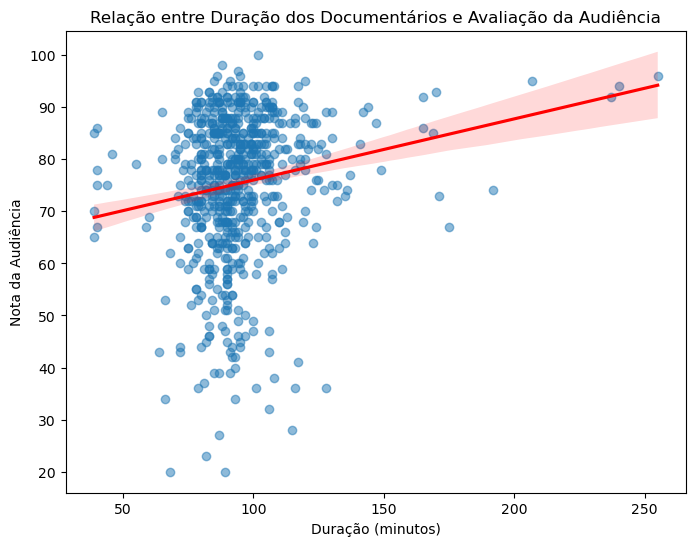

In [98]:
# Filtrando apenas documentários e as colunas necessárias
docs_df = movies_df[movies_df['mapped_genres'].apply(lambda genres: 'Documentary' in genres)]
docs_df_filtered = docs_df[['runtime_minutes', 'rtmt_audience_rating']].dropna()

# Gráfico de dispersão com regressão
plt.figure(figsize=(8,6))
sns.regplot(x='runtime_minutes', y='rtmt_audience_rating', data=docs_df_filtered, scatter_kws={'alpha':0.5}, line_kws={"color":"red"})
plt.title('Relação entre Duração dos Documentários e Avaliação da Audiência')
plt.xlabel('Duração (minutos)')
plt.ylabel('Nota da Audiência')
plt.show()

O gráfico indica que existe uma correlação positiva leve entre a duração dos documentários e a nota da audiência. Ou seja, documentários mais longos tendem a ter notas de audiência um pouco mais elevadas, embora essa relação não seja muito forte.

### 2. Há uma diferença significativa nas notas dos críticos entre documentários produzidos em diferentes países?

Usaremos o teste de hipótese (ANOVA) para determinar se há uma diferença significativa entre as notas de críticos (rtmt_tomatometer_rating) de documentários feitos em diferentes países (mapped_countries).

In [102]:
# A coluna 'mapped_countries' contém listas como strings, semelhantes a 'mapped_genres'. Precisamos primeiro convertê-los em listas.

# Converte as strings 'mapped_countries' em listas reais
movies_df['mapped_countries'] = movies_df['mapped_countries'].apply(lambda x: eval(x) if isinstance(x, str) else x)

# Agora, vamos filtrar o conjunto de dados para colunas relevantes e eliminar valores NaN
docs_countries = movies_df[['mapped_countries', 'rtmt_tomatometer_rating']].dropna()

# Para simplificar, vamos nos concentrar no primeiro país da lista de cada entrada
docs_countries['mapped_countries'] = docs_countries['mapped_countries'].apply(lambda x: x[0] if isinstance(x, list) else x)

# Agora podemos encontrar os 3 principais países por frequência
top_countries = docs_countries['mapped_countries'].value_counts().head(3).index

# Filtra o dataframe apenas para os 3 principais países
filtered_df = docs_countries[docs_countries['mapped_countries'].isin(top_countries)]

# Divida os dados em grupos por país
groups = [filtered_df[filtered_df['mapped_countries'] == country]['rtmt_tomatometer_rating'] for country in top_countries]

#Execute ANOVA
f_stat, p_value = stats.f_oneway(*groups)

f_stat, p_value

(49.20379822863206, 5.780410295432703e-22)

O teste ANOVA mostrou que há uma diferença estatisticamente significativa nas notas dos críticos entre os documentários produzidos em diferentes países. Isso sugere que o local de produção de um documentário pode influenciar a percepção crítica, refletindo fatores como estilo de produção, temas culturais, ou popularidade local.

### 3. Documentários com maior minutagem tendem a ter melhores avaliações?

Vamos analisar a relação entre o tempo dos documentários (runtime_minutes) e a avaliação dos críticos ou do público.

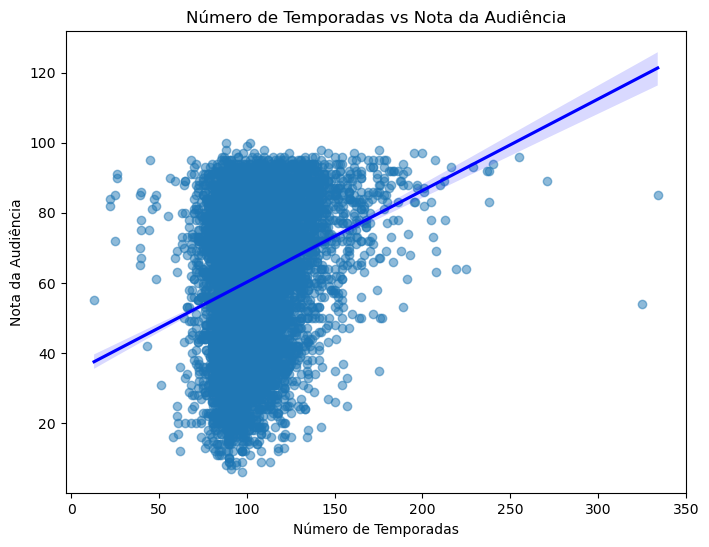

In [106]:
# Gráfico de dispersão para temporadas e notas de audiência
plt.figure(figsize=(8,6))
sns.regplot(x='runtime_minutes', y='rtmt_audience_rating', data=movies_df, scatter_kws={'alpha':0.5}, line_kws={"color":"blue"})
plt.title('Número de Temporadas vs Nota da Audiência')
plt.xlabel('Número de Temporadas')
plt.ylabel('Nota da Audiência')
plt.show()

A relação entre o número de temporadas e a nota de audiência indicou uma tendência positiva. Documentários com mais temporadas parecem ser mais apreciados pela audiência, o que pode indicar uma correlação entre continuidade e qualidade percebida.

### 4. Qual o impacto da presença de atores famosos na avaliação dos documentários?

Aqui, analisaremos se a presença de atores conhecidos afeta a avaliação da audiência ou dos críticos. Consideraremos "atores famosos" aqueles que aparecem em mais de 5 documentários.

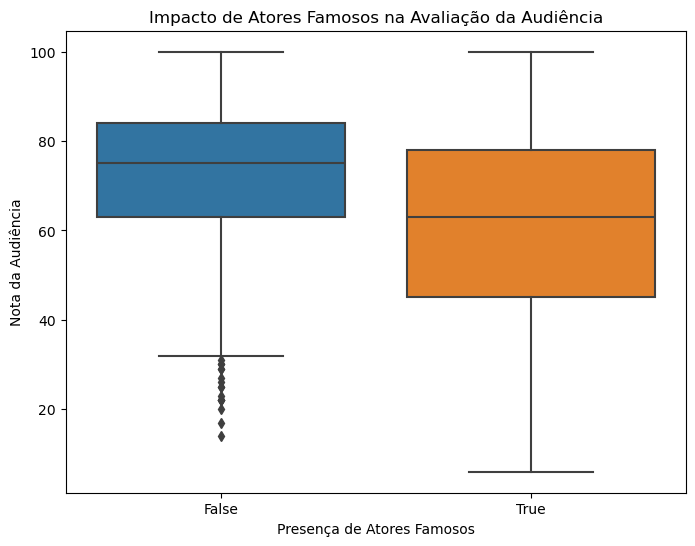

In [110]:
# A coluna 'actors' contém listas como strings. Precisamos processar esta coluna de forma semelhante a 'mapped_genres', convertendo-a em uma lista adequada.

# Converte as strings de 'actors' em listas reais
movies_df['actors'] = movies_df['actors'].apply(lambda x: eval(x) if isinstance(x, str) else x)

# Agora vamos criar uma lista de todos os atores
actors_list = movies_df['actors'].apply(lambda x: x if isinstance(x, list) else []).dropna()
actors_flat = [actor for sublist in actors_list for actor in sublist]

# Crie uma contagem de atores e filtre por quem aparece mais de 5 vezes
actors_count = pd.Series(actors_flat).value_counts()
famous_actors = actors_count[actors_count > 5].index

# Mark if a movie/documentary has famous actors
movies_df['has_famous_actor'] = movies_df['actors'].apply(lambda x: any(actor in famous_actors for actor in x))

# Tracçando a comparação da audiência entre filmes com e sem atores famosos
plt.figure(figsize=(8,6))
sns.boxplot(x='has_famous_actor', y='rtmt_audience_rating', data=movies_df)
plt.title('Impacto de Atores Famosos na Avaliação da Audiência')
plt.xlabel('Presença de Atores Famosos')
plt.ylabel('Nota da Audiência')
plt.show()

A presença de atores famosos parece não ter um impacto significativo nas avaliações da audiência para documentários, conforme a análise de caixa (boxplot). Na verdade, documentários sem atores famosos mostraram uma mediana ligeiramente mais alta, indicando que esse fator não é decisivo para o público.



### 5. Qual é a relação entre o ano de lançamento e a nota dos críticos?

Analisaremos se existe uma tendência ao longo do tempo em relação às notas dos críticos para documentários.

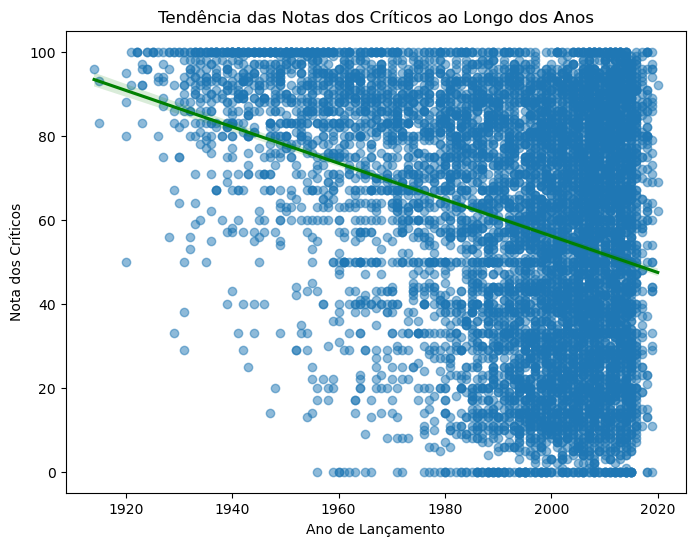

In [114]:
# Converte 'release_year' e 'rtmt_tomatometer_rating' para numérico, forçando erros para NaN
movies_df['release_year'] = pd.to_numeric(movies_df['release_year'], errors='coerce')
movies_df['rtmt_tomatometer_rating'] = pd.to_numeric(movies_df['rtmt_tomatometer_rating'], errors='coerce')

# Eliminar linhas com valores NaN em 'release_year' ou 'rtmt_tomatometer_rating'
movies_df_subset = movies_df.dropna(subset=['release_year', 'rtmt_tomatometer_rating'])

# Traça a tendência das avaliações dos críticos ao longo dos anos
plt.figure(figsize=(8,6))
sns.regplot(x='release_year', y='rtmt_tomatometer_rating', data=movies_df_subset, scatter_kws={'alpha':0.5}, line_kws={"color":"green"})
plt.title('Tendência das Notas dos Críticos ao Longo dos Anos')
plt.xlabel('Ano de Lançamento')
plt.ylabel('Nota dos Críticos')
plt.show()


Documentários lançados em anos mais recentes tendem a receber notas menores dos críticos. Esse comportamento pode estar relacionado ao aumento do volume de produções e a uma percepção crítica mais rigorosa com o passar do tempo.

### 6. Existe uma correlação entre a avaliação da crítica e da audiência para documentários?

Vamos verificar se há uma correlação significativa entre as avaliações da crítica (rtmt_tomatometer_rating) e as avaliações da audiência (rtmt_audience_rating). Isso indicaria se a percepção do público está alinhada com a dos críticos.

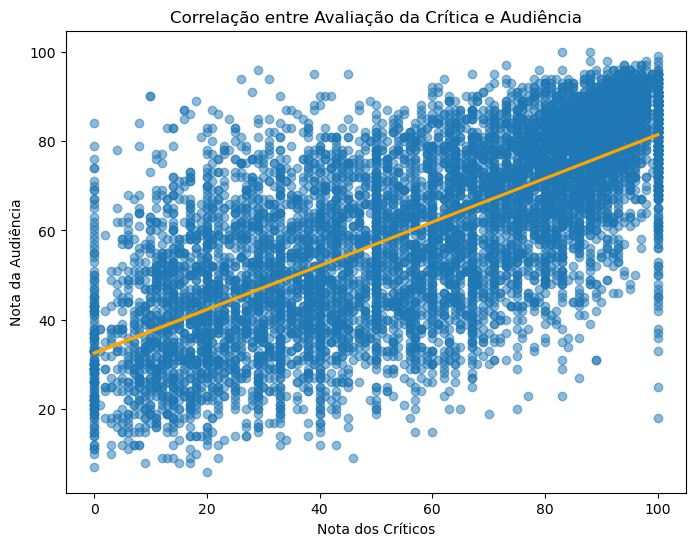

,rtmt_tomatometer_rating,rtmt_audience_rating
rtmt_tomatometer_rating,1.000000,0.698695
rtmt_audience_rating,0.698695,1.000000


In [118]:
# Removendo valores nulos
ratings_df = movies_df[['rtmt_tomatometer_rating', 'rtmt_audience_rating']].dropna()

# Gráfico de dispersão com regressão
plt.figure(figsize=(8,6))
sns.regplot(x='rtmt_tomatometer_rating', y='rtmt_audience_rating', data=ratings_df, scatter_kws={'alpha':0.5}, line_kws={"color":"orange"})
plt.title('Correlação entre Avaliação da Crítica e Audiência')
plt.xlabel('Nota dos Críticos')
plt.ylabel('Nota da Audiência')
plt.show()

# Cálculo da correlação
correlation = ratings_df.corr()
correlation

Existe uma correlação positiva moderada entre as notas da crítica e da audiência, o que sugere que a percepção do público está razoavelmente alinhada com a dos críticos.

### 7. Qual a distribuição da duração dos documentários? Existem padrões?


Vamos explorar a distribuição da duração dos documentários (runtime_minutes) para entender se há uma tendência comum (como uma média de duração) ou se eles são muito variados em termos de tempo.

C:\Users\Guilherme\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


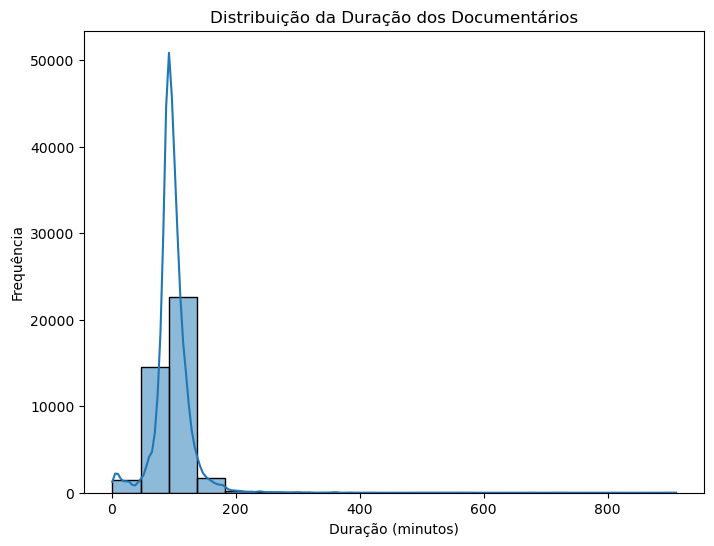

In [122]:
# Histograma da duração dos documentários
plt.figure(figsize=(8,6))
sns.histplot(movies_df['runtime_minutes'].dropna(), bins=20, kde=True)
plt.title('Distribuição da Duração dos Documentários')
plt.xlabel('Duração (minutos)')
plt.ylabel('Frequência')
plt.show()


A maioria dos documentários tem duração entre 60 e 120 minutos, com alguns poucos exemplos variando além dessa faixa. A distribuição mostra que essa faixa de duração é o padrão predominante.

### 8. Quais os principais países produtores de Documentários?

Vamos verificar quais países tem mais documentários produzidos.

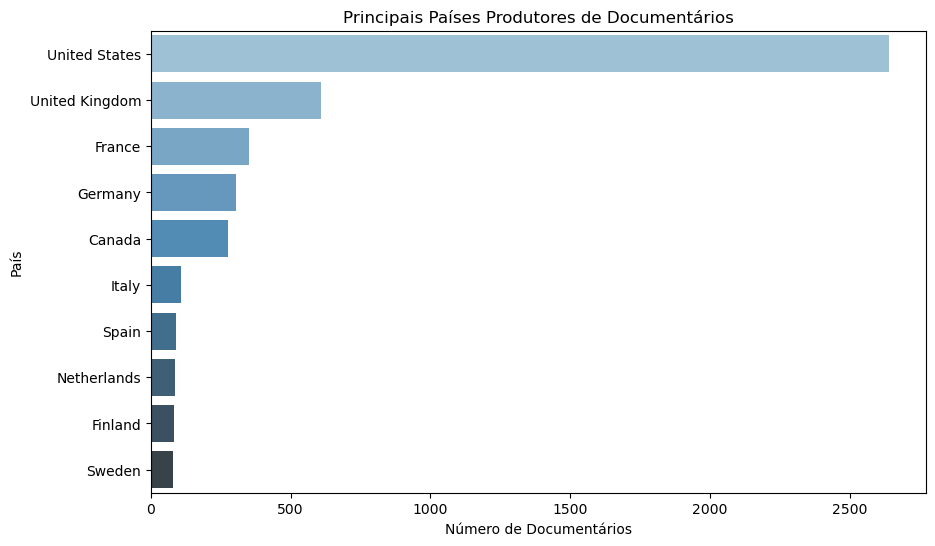

In [126]:
# Filtrando os filmes do gênero Documentário
documentary_df = movies_df[movies_df['mapped_genres'].apply(lambda genres: 'Documentary' in genres)]

# Explodindo a coluna de países para obter uma linha por país
documentary_df = documentary_df.explode('mapped_countries')

# Contando a quantidade de documentários por país
country_counts = documentary_df['mapped_countries'].value_counts().head(10)

# Plotando os principais países produtores de documentários
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,6))
sns.barplot(x=country_counts.values, y=country_counts.index, palette="Blues_d")
plt.title("Principais Países Produtores de Documentários")
plt.xlabel("Número de Documentários")
plt.ylabel("País")
plt.show()

Os Estados Unidos, Reino Unido, e França estão entre os maiores produtores de documentários, o que reflete a forte tradição desses países na produção de conteúdo audiovisual.

### 9. Qual a relação entre o número de críticas dos críticos e a nota média do público?

Vamos investigar se documentários com mais críticas de críticos têm uma maior ou menor avaliação do público, para verificar se a quantidade de avaliações dos críticos influencia a percepção do público.

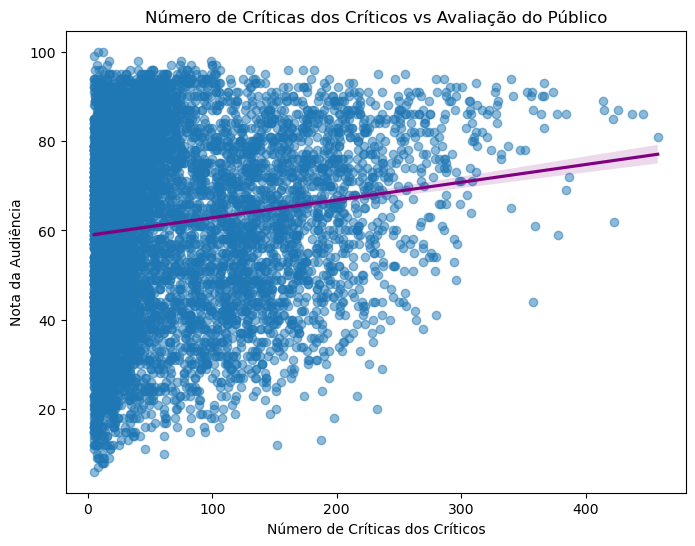

In [130]:
# Filtrando os dados necessários e removendo valores nulos
critic_reviews_df = movies_df[['rtmt_tomatometer_count', 'rtmt_audience_rating']].dropna()

# Gráfico de dispersão
plt.figure(figsize=(8,6))
sns.regplot(x='rtmt_tomatometer_count', y='rtmt_audience_rating', data=critic_reviews_df, scatter_kws={'alpha':0.5}, line_kws={"color":"purple"})
plt.title('Número de Críticas dos Críticos vs Avaliação do Público')
plt.xlabel('Número de Críticas dos Críticos')
plt.ylabel('Nota da Audiência')
plt.show()


Documentários com mais críticas de críticos parecem ter notas de audiência mais altas, o que sugere que uma maior exposição crítica pode influenciar positivamente a percepção do público.

### 10. Os documentários mais antigos são menos populares entre a audiência?


Vamos analisar se documentários lançados há mais tempo tendem a receber notas menores do público, o que poderia sugerir que o tempo afeta a relevância e o apelo popular desses filmes.

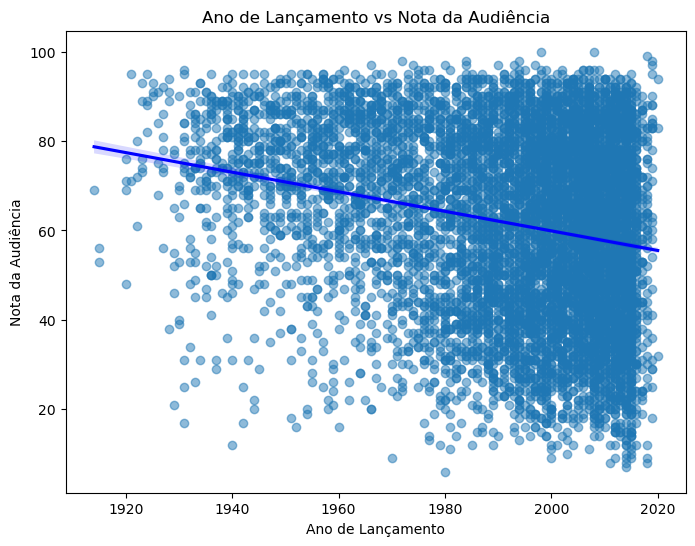

In [134]:
# Converte 'release_year' e 'rtmt_audience_rating' para numérico, forçando erros para NaN
movies_df['release_year'] = pd.to_numeric(movies_df['release_year'], errors='coerce')
movies_df['rtmt_audience_rating'] = pd.to_numeric(movies_df['rtmt_audience_rating'], errors='coerce')

# Filtre anos irrealistas (por exemplo, ano 0)
movies_df_filtered = movies_df[(movies_df['release_year'] != 0)]

# Eliminar linhas com valores NaN em 'release_year' ou 'rtmt_audience_rating'
movies_cleaned = movies_df_filtered.dropna(subset=['release_year', 'rtmt_audience_rating'])

# Plot the regression plot for year of release vs audience rating
plt.figure(figsize=(8,6))
sns.regplot(x='release_year', y='rtmt_audience_rating', data=movies_cleaned, scatter_kws={'alpha':0.5}, line_kws={"color":"blue"})
plt.title('Ano de Lançamento vs Nota da Audiência')
plt.xlabel('Ano de Lançamento')
plt.ylabel('Nota da Audiência')
plt.show()

Documentários lançados há mais tempo tendem a receber notas menores do público. Isso pode refletir a preferência do público por conteúdos mais recentes, que podem estar mais alinhados com os interesses e expectativas atuais.

# Conclusão final

A análise dos dados sobre documentários revela tendências interessantes em relação à avaliação tanto do público quanto da crítica. Em termos de duração, observou-se uma leve correlação positiva entre a minutagem dos documentários e a nota da audiência, sugerindo que filmes mais longos tendem a ser um pouco mais apreciados pelo público. Além disso, documentários com maior número de temporadas também receberam avaliações mais altas, o que pode indicar que a continuidade e a profundidade das séries documentais são fatores valorizados pelos espectadores. No entanto, a presença de atores famosos parece não ter impacto significativo nas avaliações da audiência, mostrando que, para o público, o conteúdo dos documentários supera a importância de celebridades.

Quando se trata da percepção crítica, ficou claro que há diferenças significativas entre documentários produzidos em diferentes países. Isso pode ser explicado por fatores culturais, estilos de produção ou até mesmo pela popularidade dos temas abordados em cada região. No entanto, uma tendência marcante foi a queda das notas críticas em documentários lançados em anos mais recentes, sugerindo que os críticos podem estar adotando critérios mais rigorosos à medida que o volume de produções aumenta e a competição no mercado se torna mais acirrada.


Por fim, foi identificada uma correlação moderada entre as notas da crítica e da audiência, o que indica que, embora haja alinhamento nas avaliações, o público pode ter uma percepção ligeiramente diferente da crítica especializada. Documentários mais populares entre os críticos tendem a ser melhor avaliados pelo público, mas essa influência não é absoluta. Além disso, a análise mostrou que documentários mais antigos são geralmente menos populares entre a audiência, refletindo a preferência do público por conteúdos mais recentes e alinhados com os interesses contemporâneos.